awdawd

# Structure

## A. Import Libraries and Modules

### 1. Import Libraries

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import os
import time
from typing import List, Dict, Tuple, Union, Optional, Any, Callable

# Import sklearn for dataset loading and comparison
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

# Set random seed for reproducibility
np.random.seed(42)

# Configure matplotlib for better visualization
%matplotlib inline
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12

### 2. Import Modules

In [21]:
import sys
sys.path.append('..')

# Import core modules
from src.core.activations import Linear, ReLU, Sigmoid, Tanh, Softmax, Softplus, ELU
from src.core.loss_functions import MeanSquaredError, BinaryCrossEntropy, CategoricalCrossEntropy
from src.core.neural_network import NeuralNetwork
from src.core.autodiffs import AutoDiffNeuralNetwork, Value, mse_loss
from src.core.layers import Layer, DenseLayer, RMSNormalizationLayer

# Import utility modules
from src.util.visualization import (
    visualize_model_performance, visualize_model_weights_and_gradients, visualize_prediction_comparison,
    compare_models_performance, visualize_all_model_results, visualize_model_comparison
)
from src.train.trainer import Trainer, EarlyStopping

## B. Load and Prepare Dataset

### 1. Load MNIST Dataset

In [22]:
def load_mnist_data():
    """Load MNIST dataset and prepare it for training."""
    # Load data from OpenML
    X, y = fetch_openml('mnist_784', version=1, return_X_y=True, parser='auto')
    
    # Convert pandas DataFrame/Series to numpy arrays
    if hasattr(X, 'values'):
        X = X.values
    if hasattr(y, 'values'):
        y = y.values
    
    # Convert data type
    X = X.astype('float32')
    y = y.astype('int')
    
    # Scale features to [0, 1]
    X = X / 255.0
    
    return X, y

In [23]:
print("Loading MNIST dataset...")
X, y = load_mnist_data()

Loading MNIST dataset...


### 2. Prepare MNIST Dataset

In [24]:
def prepare_mnist_data(X, y, num_samples, test_size=0.2):
    """Prepare MNIST data for training and testing."""
    # Convert pandas DataFrame/Series to numpy arrays if needed
    if hasattr(X, 'values'):
        X = X.values
    if hasattr(y, 'values'):
        y = y.values
    
    # Use a subset of data for faster training
    subset_indices = np.random.choice(len(X), num_samples, replace=False)
    X_subset = X[subset_indices]
    y_subset = y[subset_indices]
    
    # Split into train/test
    X_train, X_test, y_train_raw, y_test_raw = train_test_split(
        X_subset, y_subset, test_size=test_size, random_state=42, stratify=y_subset
        )
    
    # One-hot encode the labels
    # Use sparse_output=False instead of sparse=False for newer scikit-learn versions
    try:
        encoder = OneHotEncoder(sparse_output=False)
    except TypeError:
        encoder = OneHotEncoder(sparse=False)
        
    y_train_encoded = encoder.fit_transform(y_train_raw.reshape(-1, 1))
    y_test_encoded = encoder.transform(y_test_raw.reshape(-1, 1))
    
    return X_train, X_test, y_train_encoded, y_test_encoded, y_train_raw, y_test_raw

In [25]:
print("Preparing MNIST dataset...")
X_train, X_test, y_train, y_test, y_train_raw, y_test_raw = prepare_mnist_data(
    X, y, num_samples=70000, test_size=0.2
)
print(f"Loaded {len(X_train)} training samples and {len(X_test)} test samples.")
print(f"Input shape: {X_train.shape[1]} features, Output shape: {y_train.shape[1]} classes")

small_X_train = X_train[:X_train.shape[0] // 10]
small_y_train = y_train[:y_train.shape[0] // 10]
small_X_test = X_test[:X_test.shape[0] // 10]
small_y_test = y_test[:y_test.shape[0] // 10]
small_y_train_raw = y_train_raw[:len(y_train_raw) // 10]
small_y_test_raw = y_test_raw[:len(y_test_raw) // 10]

Preparing MNIST dataset...
Loaded 56000 training samples and 14000 test samples.
Input shape: 784 features, Output shape: 10 classes


### 3. Visualize MNIST Dataset

In [26]:
def visualize_mnist_samples(X, y, num_samples=10):
    """Visualize random samples from the MNIST dataset."""
    indices = np.random.choice(len(X), num_samples, replace=False)
    images = X[indices]
    labels = y[indices]
    
    fig, axs = plt.subplots(1, num_samples, figsize=(15, 2))
    for i in range(num_samples):
        axs[i].imshow(images[i].reshape(28, 28), cmap='gray')
        axs[i].set_title(f"Label: {labels[i]}")
        axs[i].axis('off')
    
    plt.tight_layout()
    return fig

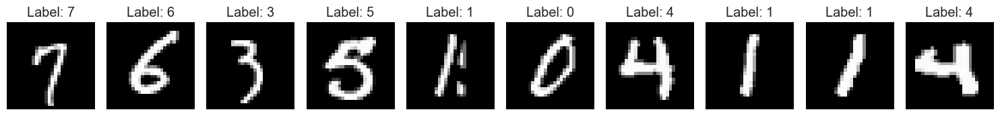

In [27]:
# Visualize MNIST samples
fig = visualize_mnist_samples(X_train, y_train_raw)
plt.show()

## C. Neural Network Implementation

### 1. Base Model

In [28]:
def create_base_model(
    input_size, 
    hidden_layers, 
    output_size,
    activation_functions,
    output_activation,
    learning_rate,
    loss_function,
    weight_initialization,
    regularization_type,
    normalization_type
):
    """Create a neural network with specified architecture and configuration.
    
    Parameters:
    -----------
    input_size : int
        Size of input features
    hidden_layers : list
        List containing number of neurons in each hidden layer
    output_size : int
        Number of output classes
    activation_function : str
        Activation function for hidden layers ('relu', 'sigmoid', 'tanh', 'linear', 'softplus', 'elu')
    output_activation : str
        Activation function for output layer ('softmax', 'sigmoid')
    learning_rate : str
        Learning rate for optimizer (0.001, 0.0005, 0.0001)
    loss_function : str
        Loss function to use ('mse', 'binary_crossentropy', 'categorical_crossentropy')
    weight_initialization : str
        Weight init method ('he', 'xavier', 'random_normal', 'random_uniform', 'zero')
    regularization_type : str
        Regularization type ('l1', 'l2', None)
    normalization_type : str
        Normalization type ('rms', None)
        
    Returns:
    --------
    model : NeuralNetwork
        Configured neural network model
    """
    # Define layer sizes (input + hidden + output)
    layer_sizes = [input_size] + hidden_layers + [output_size]
    
    # Get mapped values for activation functions
    activation_mapping = {
        'linear': Linear(),
        'relu': ReLU(),
        'sigmoid': Sigmoid(),
        'tanh': Tanh(),
        'softmax': Softmax(),
        'softplus': Softplus(),
        'elu': ELU()
    }
    
    # Process activation functions
    activations = []
    for i in range(len(hidden_layers) + 1):  # +1 for output layer
        if i < len(hidden_layers):
            act_fn = activation_functions
        else:
            act_fn = output_activation
            
        activations.append(activation_mapping.get(act_fn.lower()))
    
    # Create base model
    model = NeuralNetwork(
        layer_sizes=layer_sizes,
        activation_functions=activations,
        weight_initialization=weight_initialization,
        seed=42
    )
    
    # Apply regularization if specified
    if regularization_type != 'none':
        _apply_regularization(model, regularization_type)
    
    # Apply normalization if specified
    if normalization_type != 'none':
        _apply_normalization(model, normalization_type, hidden_layers)
    
    return model

def _apply_regularization(model, regularization_type, lambda_val=None):
    """Apply regularization to model layers."""
    # For large networks, use different default lambda values
    if lambda_val is None:
        if regularization_type.lower() == 'l1':
            lambda_val = 1e-7  # Much smaller for L1
        else:
            lambda_val = 1e-6  # Smaller for L2
    
    # Add L1 or L2 regularization to all Dense layers
    for i, layer in enumerate(model.layers):
        if hasattr(layer, 'weights'):
            if regularization_type.lower() == 'l1':
                layer.l1_lambda = lambda_val
                layer.l2_lambda = 0.0
            elif regularization_type.lower() == 'l2':
                layer.l1_lambda = 0.0
                layer.l2_lambda = lambda_val

def _apply_normalization(model, normalization_type, hidden_layers):
    """Apply normalization to model by inserting normalization layers."""
    if normalization_type.lower() == 'rms':
        # Create a new layers list
        new_layers = []
        layer_idx = 0
        
        # For each layer in the original model
        for i, layer in enumerate(model.layers):
            # Add the original layer
            new_layers.append(layer)
            
            # If this is a dense layer (not the output layer), add RMS normalization
            if hasattr(layer, 'weights') and layer_idx < len(hidden_layers):
                # Create RMS normalization layer with the same size as the current layer's output
                rms_layer = RMSNormalizationLayer(input_size=layer.output_size)
                new_layers.append(rms_layer)
                
                # Increment layer counter (only for dense layers)
                layer_idx += 1
        
        # Replace model's layers with the new structure
        model.layers = new_layers

### 2. Train Model

In [29]:
def train_model(
    model, 
    X_train, 
    y_train, 
    X_test, 
    y_test, 
    learning_rate,
    loss_function, 
    batch_size=64, 
    epochs=50,
    verbose=1,
    callbacks=None
):
    """Train a neural network model with specified hyperparameters.
    
    Parameters:
    -----------
    model : NeuralNetwork
        The model to train
    X_train : ndarray
        Training data
    y_train : ndarray
        Training labels (one-hot encoded)
    X_test : ndarray, optional
        Test/validation data
    y_test : ndarray, optional  
        Test/validation labels (one-hot encoded)
    learning_rate : float
        Learning rate for training
    loss_function : str
        Loss function type ('categorical_crossentropy', 'binary_crossentropy', 'mse')
    batch_size : int
        Batch size for training
    epochs : int
        Number of epochs to train
    verbose : int
        Verbosity level (0, 1, 2)
    callbacks : list
        List of callback functions to execute during training
        
    Returns:
    --------
    tuple : (trained_model, history, predictions, accuracy)
        trained_model: The trained neural network
        history: Training history dictionary
        predictions: Model predictions on test set (if provided)
        accuracy: Model accuracy on test set (if provided)
    """
    # Initialize loss function with instantiation
    loss_mapping = {
        'mean_squared_error': MeanSquaredError(),
        'binary_crossentropy': BinaryCrossEntropy(),
        'categorical_crossentropy': CategoricalCrossEntropy()
    }
    
    loss_function = loss_mapping.get(loss_function.lower())
    
    # Create trainer with proper parameters
    trainer = Trainer(
        model=model, 
        learning_rate=learning_rate,
        loss_function=loss_function,
        batch_size=batch_size, 
        epochs=epochs,
        verbose=verbose
    )
    
    # Train model
    print(f"Training model with learning_rate={learning_rate}, batch_size={batch_size}, epochs={epochs}")
    history = trainer.train(X_train, y_train, X_val=X_test, y_val=y_test, callbacks=callbacks or [])
    
    # Compute predictions and accuracy if test data is provided
    predictions = None
    accuracy = None
    if X_test is not None and y_test is not None:
        predictions = model.predict(X_test)
        accuracy = np.mean(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1))
        print(f"Test accuracy: {accuracy:.4f}")
    
    return model, history, predictions, accuracy

### 3. Result History

In [30]:
def evaluate_model_results(model, history, X_test=None, y_test=None, predictions=None):
    """Evaluate and organize model results for analysis.
    
    Parameters:
    -----------
    model : NeuralNetwork
        Trained model
    history : dict
        Training history
    X_test : ndarray, optional
        Test data
    y_test : ndarray, optional
        Test labels
    predictions : ndarray, optional
        Model predictions (if already computed)
        
    Returns:
    --------
    dict : Results dictionary containing model, history, predictions, and metrics
    """
    results = {
        "model": model,
        "history": history,
    }
    
    # Add predictions and accuracy if test data is provided
    if X_test is not None and y_test is not None:
        if predictions is None:
            predictions = model.predict(X_test)
        
        results["predictions"] = predictions
        results["accuracy"] = np.mean(np.argmax(predictions, axis=1) == np.argmax(y_test, axis=1))
        
        # Add confusion matrix
        y_true = np.argmax(y_test, axis=1)
        y_pred = np.argmax(predictions, axis=1)
        results["confusion_matrix"] = confusion_matrix(y_true, y_pred)
        
        print("\nModel Evaluation Results:")
        print(f"Accuracy: {results['accuracy']:.4f}")
    
    return results

#### Compile

In [31]:
def run_hyperparameter(
    X_train, X_test, y_train, y_test,
    name,
    hidden_layers,         
    activation_functions,       
    output_activation,
    learning_rate,
    loss_function,
    weight_initialization,
    regularization_type,
    normalization_type,
    batch_size=32,
    epochs=50,
    verbose=1
):
    """Run an experiment with specific hyperparameters and visualize results."""
    # Create the model with corrected parameters
    model = create_base_model(
        input_size=784,
        hidden_layers=hidden_layers,
        output_size=10,
        activation_functions=activation_functions,
        output_activation=output_activation, 
        learning_rate=learning_rate,
        loss_function=loss_function,
        weight_initialization=weight_initialization,
        regularization_type=regularization_type,
        normalization_type=normalization_type
    )
    
    # Print experiment details
    print(f"\nTraining {name} model...")
    print(f"Architecture: {hidden_layers}, Activation: {activation_functions}, Output: {output_activation}")
    print(f"LR: {learning_rate}, Loss: {loss_function}, Weight: {weight_initialization}")
    if regularization_type != 'none': print(f"Regularize: {regularization_type}")
    if normalization_type != 'none': print(f"Normalize: {normalization_type}")
    
    # Train model
    trained_model, history, predictions, accuracy = train_model(
        model=model, 
        X_train=X_train, 
        y_train=y_train,
        X_test=X_test, 
        y_test=y_test, 
        learning_rate=learning_rate, 
        loss_function=loss_function,
        batch_size=batch_size,
        epochs=epochs, 
        verbose=verbose
    )
    
    # Get results and visualize
    results = evaluate_model_results(trained_model, history, X_test, y_test, predictions)
    
    
    # Visualize performance and weights
    fig_history = visualize_model_performance(trained_model, history, f"{name}: Training History")
    plt.figure(fig_history.number)
    plt.show()
    
    fig_weights = visualize_model_weights_and_gradients(trained_model)
    plt.figure(fig_weights.number)
    plt.show()
    
    return trained_model, history, predictions, accuracy, results

## C. Layer Comparison

### 1. Depth 1: 3 Layer

#### a. Width 1: 16, 64, 16


Training Depth 3 Layer, Width 16-64-16 model...
Architecture: [16, 64, 16], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.1904 - val_loss: 2.1026oss: 2.1548
Epoch 2/50 - train_loss: 1.9679 - val_loss: 1.8284oss: 1.8574
Epoch 3/50 - train_loss: 1.6815 - val_loss: 1.5357oss: 1.4848
Epoch 4/50 - train_loss: 1.4314 - val_loss: 1.3201oss: 1.0707
Epoch 5/50 - train_loss: 1.2620 - val_loss: 1.1843oss: 1.2222
Epoch 6/50 - train_loss: 1.1378 - val_loss: 1.0787oss: 0.6969
Epoch 7/50 - train_loss: 1.0462 - val_loss: 0.9979oss: 0.9009
Epoch 8/50 - train_loss: 0.9706 - val_loss: 0.9393oss: 0.9542
Epoch 9/50 - train_loss: 0.9111 - val_loss: 0.8814oss: 0.9744
Epoch 10/50 - train_loss: 0.8629 - val_loss: 0.8484oss: 0.7984
Epoch 11/50 - train_loss: 0.8216 - val_loss: 0.8077oss: 1.2897
Epoch 12/50 - train_loss: 0.7861 - val_loss: 0.7766oss: 0.8522
Epoch 13/50 - train_lo

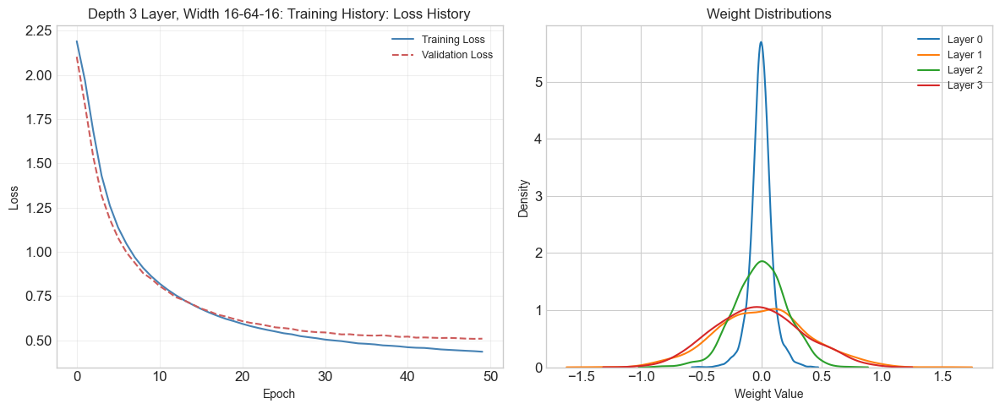

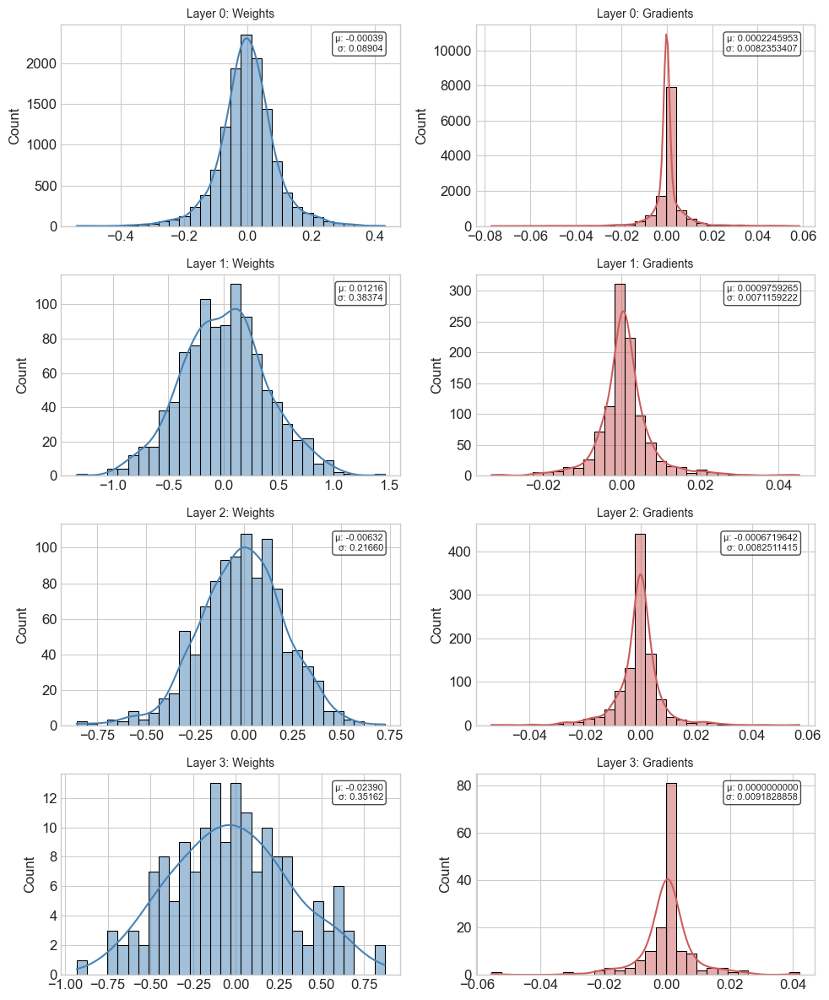

In [32]:
trained_model_depth1_width1, history_depth1_width1, predictions_depth1_width1, accuracy_depth1_width1, results_depth1_width1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 3 Layer, Width 16-64-16",
    hidden_layers=[16, 64, 16],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

#### b. Width 2: 64, 16, 64


Training Depth 3 Layer, Width 64-16-64 model...
Architecture: [64, 16, 64], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.1296 - val_loss: 1.8561oss: 1.9859
Epoch 2/50 - train_loss: 1.6819 - val_loss: 1.4930oss: 1.5416
Epoch 3/50 - train_loss: 1.3697 - val_loss: 1.2277oss: 1.0262
Epoch 4/50 - train_loss: 1.1391 - val_loss: 1.0454oss: 1.0791
Epoch 5/50 - train_loss: 0.9817 - val_loss: 0.9180oss: 0.8693
Epoch 6/50 - train_loss: 0.8759 - val_loss: 0.8402oss: 0.7024
Epoch 7/50 - train_loss: 0.8043 - val_loss: 0.7867oss: 0.8971
Epoch 8/50 - train_loss: 0.7524 - val_loss: 0.7406oss: 0.6295
Epoch 9/50 - train_loss: 0.7068 - val_loss: 0.7095oss: 0.6121
Epoch 10/50 - train_loss: 0.6686 - val_loss: 0.6802oss: 0.6521
Epoch 11/50 - train_loss: 0.6352 - val_loss: 0.6505oss: 0.5859
Epoch 12/50 - train_loss: 0.6040 - val_loss: 0.6200oss: 0.9595
Epoch 13/50 - train_lo

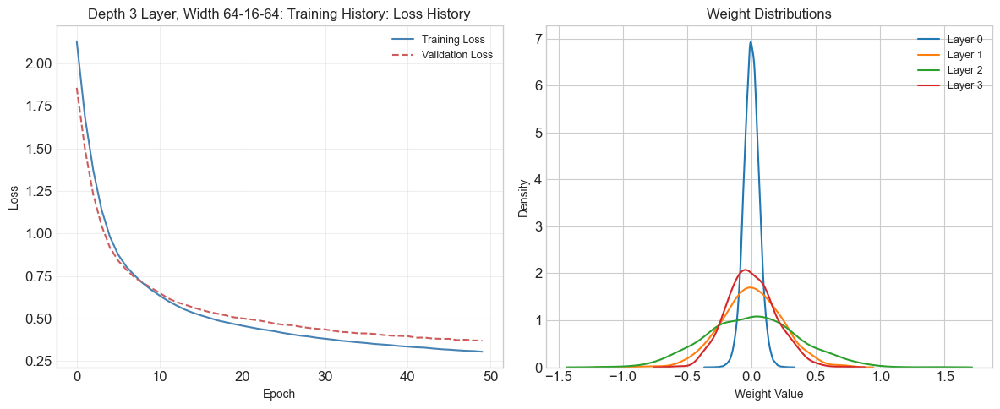

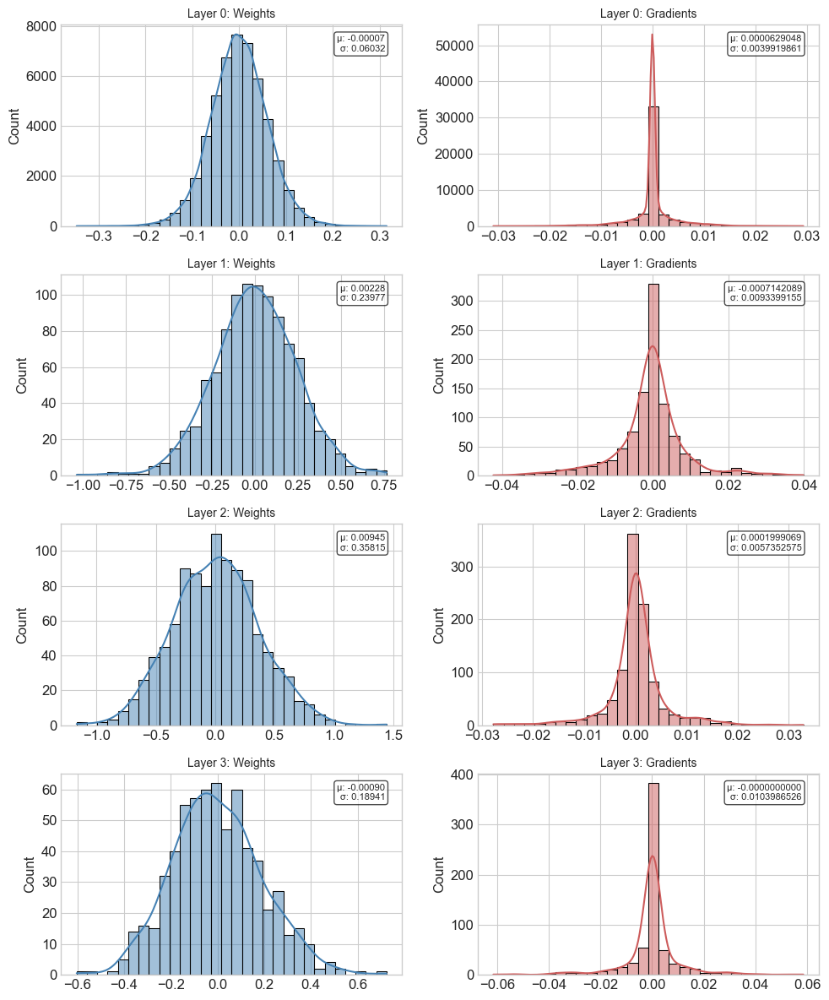

In [33]:
trained_model_depth1_width2, history_depth1_width2, predictions_depth1_width2, accuracy_depth1_width2, results_depth1_width2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 3 Layer, Width 64-16-64",
    hidden_layers=[64, 16, 64],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

#### c. Width 3: 40, 40, 40


Training Depth 3 Layer, Width 40-40-40 model...
Architecture: [40, 40, 40], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.1956 - val_loss: 2.0409oss: 1.9425
Epoch 2/50 - train_loss: 1.9467 - val_loss: 1.8285oss: 1.9115
Epoch 3/50 - train_loss: 1.7319 - val_loss: 1.6036oss: 1.6474
Epoch 4/50 - train_loss: 1.4966 - val_loss: 1.3537oss: 1.3827
Epoch 5/50 - train_loss: 1.2511 - val_loss: 1.1265oss: 1.1649
Epoch 6/50 - train_loss: 1.0569 - val_loss: 0.9624oss: 1.0731
Epoch 7/50 - train_loss: 0.9185 - val_loss: 0.8439oss: 0.8371
Epoch 8/50 - train_loss: 0.8152 - val_loss: 0.7640oss: 1.0785
Epoch 9/50 - train_loss: 0.7426 - val_loss: 0.7051oss: 0.5572
Epoch 10/50 - train_loss: 0.6838 - val_loss: 0.6571oss: 0.5144
Epoch 11/50 - train_loss: 0.6365 - val_loss: 0.6188oss: 0.7053
Epoch 12/50 - train_loss: 0.5960 - val_loss: 0.5859oss: 0.6603
Epoch 13/50 - train_lo

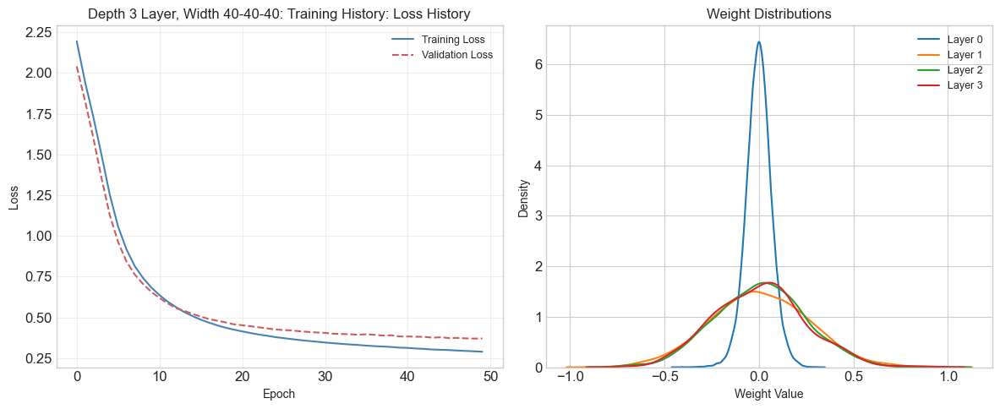

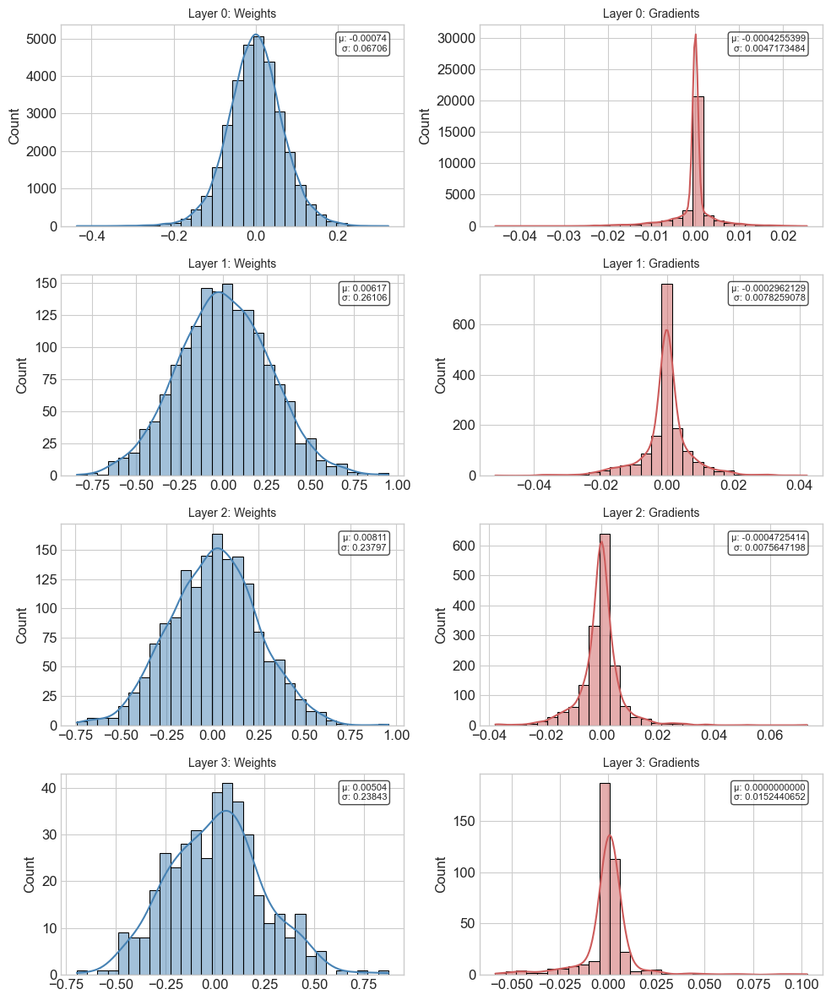

In [34]:
trained_model_depth1_width3, history_depth1_width3, predictions_depth1_width3, accuracy_depth1_width3, results_depth1_width3 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 3 Layer, Width 40-40-40",
    hidden_layers=[40, 40, 40],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 2. Depth 2: 5 Layer

#### a. Width 1: 16, 64, 256, 64, 16


Training Depth 5 Layer, Width 16-64-256-64-16 model...
Architecture: [16, 64, 256, 64, 16], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.2852 - val_loss: 2.2279oss: 2.2818
Epoch 2/50 - train_loss: 2.1833 - val_loss: 2.0889oss: 2.1210
Epoch 3/50 - train_loss: 1.9814 - val_loss: 1.8657oss: 1.7448
Epoch 4/50 - train_loss: 1.7623 - val_loss: 1.6442oss: 1.4785
Epoch 5/50 - train_loss: 1.5670 - val_loss: 1.4741oss: 1.3400
Epoch 6/50 - train_loss: 1.4145 - val_loss: 1.3320oss: 1.1785
Epoch 7/50 - train_loss: 1.2848 - val_loss: 1.2301oss: 1.1617
Epoch 8/50 - train_loss: 1.1884 - val_loss: 1.1446oss: 1.0750
Epoch 9/50 - train_loss: 1.1198 - val_loss: 1.0778oss: 1.2003
Epoch 10/50 - train_loss: 1.0715 - val_loss: 1.0376oss: 1.1456
Epoch 11/50 - train_loss: 1.0243 - val_loss: 0.9845oss: 1.0985
Epoch 12/50 - train_loss: 0.9778 - val_loss: 0.9504oss: 1.0034
Epoch 

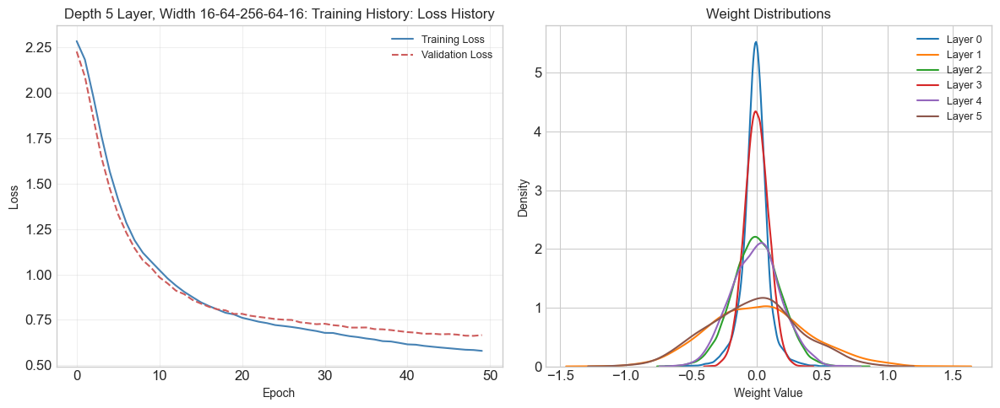

In [ ]:
trained_model_depth2_width1, history_depth2_width1, predictions_depth2_width1, accuracy_depth2_width1, results_depth2_width1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 5 Layer, Width 16-64-256-64-16",
    hidden_layers=[16, 64, 256, 64, 16],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

#### b. Width 2: 256, 64, 16, 64, 256


Training Depth 5 Layer, Width 256-64-16-64-256 model...
Architecture: [256, 64, 16, 64, 256], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 2.2085 - val_loss: 1.8367oss: 1.9290
Epoch 2/50 - train_loss: 1.4840 - val_loss: 1.1567oss: 1.3807
Epoch 3/50 - train_loss: 0.9822 - val_loss: 0.8268oss: 0.6412
Epoch 4/50 - train_loss: 0.7381 - val_loss: 0.6967oss: 0.4428
Epoch 5/50 - train_loss: 0.6219 - val_loss: 0.6240oss: 0.3662
Epoch 6/50 - train_loss: 0.5441 - val_loss: 0.5652oss: 0.6110
Epoch 7/50 - train_loss: 0.4794 - val_loss: 0.5139oss: 0.3267
Epoch 8/50 - train_loss: 0.4420 - val_loss: 0.4960oss: 0.2671
Epoch 9/50 - train_loss: 0.4088 - val_loss: 0.4505oss: 0.2469
Epoch 10/50 - train_loss: 0.3798 - val_loss: 0.4459oss: 0.4144
Epoch 11/50 - train_loss: 0.3648 - val_loss: 0.4251oss: 0.1524
Epoch 12/50 - train_loss: 0.3483 - val_loss: 0.4319oss: 0.4788
Epoc

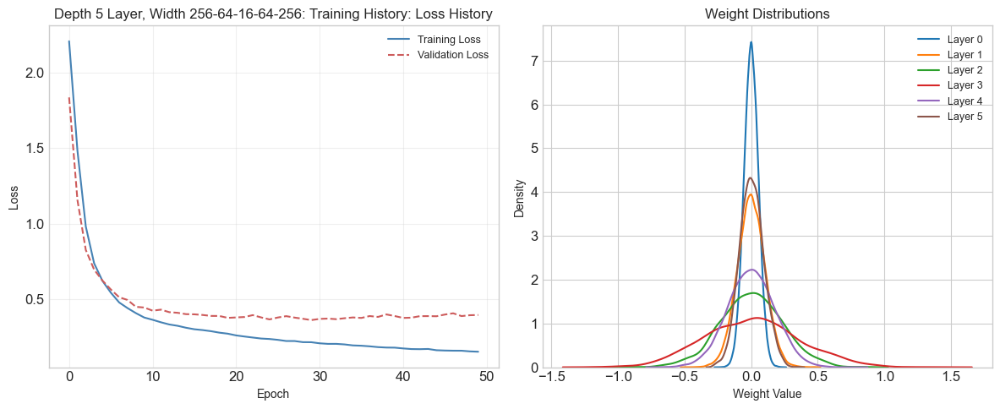

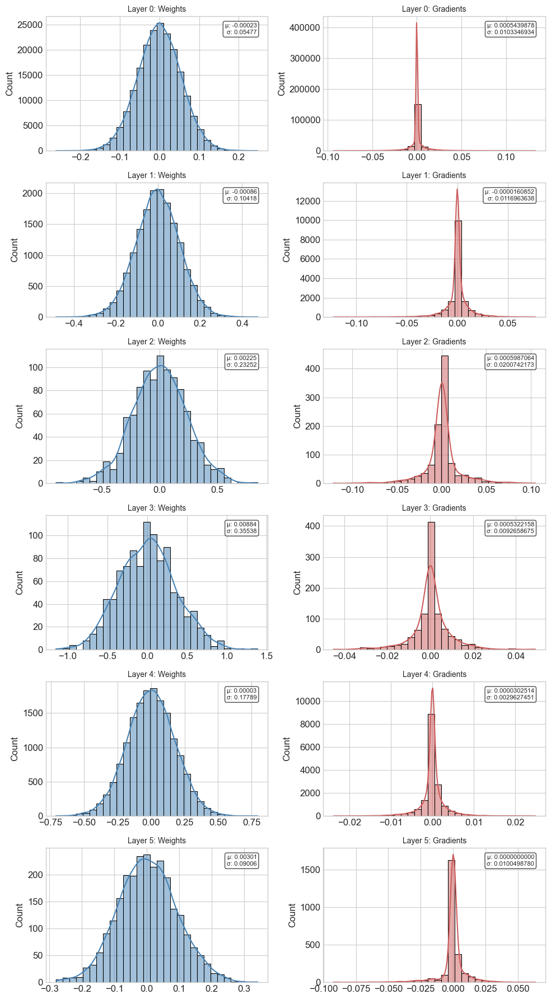

In [ ]:
trained_model_depth2_width2, history_depth2_width2, predictions_depth2_width2, accuracy_depth2_width2, results_depth2_width2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 5 Layer, Width 256-64-16-64-256",
    hidden_layers=[256, 64, 16, 64, 256],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

#### c. Width 3: 108, 108, 108, 108, 108


Training Depth 5 Layer, Width 108-108-108-108-108 model...
Architecture: [108, 108, 108, 108, 108], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 2.1261 - val_loss: 1.7847oss: 1.6086
Epoch 2/50 - train_loss: 1.4044 - val_loss: 1.0616oss: 0.8607
Epoch 3/50 - train_loss: 0.8458 - val_loss: 0.7092oss: 0.6584
Epoch 4/50 - train_loss: 0.6075 - val_loss: 0.5787oss: 0.5722
Epoch 5/50 - train_loss: 0.5017 - val_loss: 0.5153oss: 0.3430
Epoch 6/50 - train_loss: 0.4429 - val_loss: 0.4743oss: 0.6558
Epoch 7/50 - train_loss: 0.4035 - val_loss: 0.4561oss: 0.2021
Epoch 8/50 - train_loss: 0.3762 - val_loss: 0.4540oss: 0.4589
Epoch 9/50 - train_loss: 0.3571 - val_loss: 0.4260oss: 0.5030
Epoch 10/50 - train_loss: 0.3366 - val_loss: 0.4214oss: 0.2093
Epoch 11/50 - train_loss: 0.3244 - val_loss: 0.4069oss: 0.4110
Epoch 12/50 - train_loss: 0.3089 - val_loss: 0.3950oss: 0.214

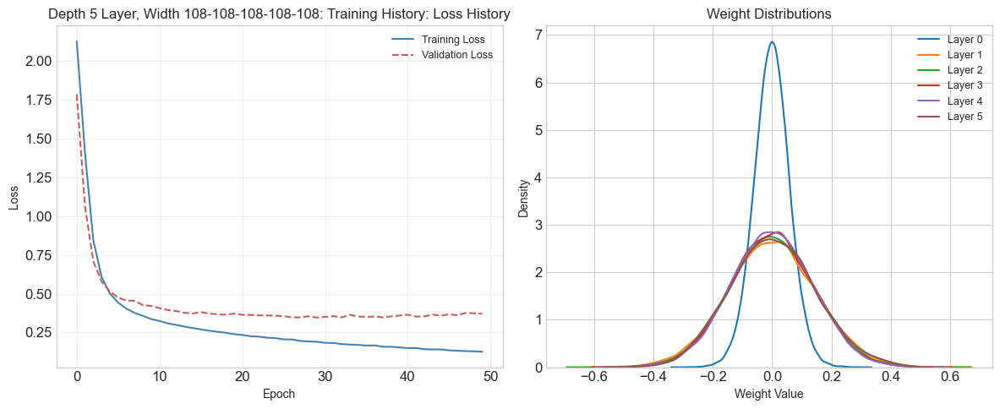

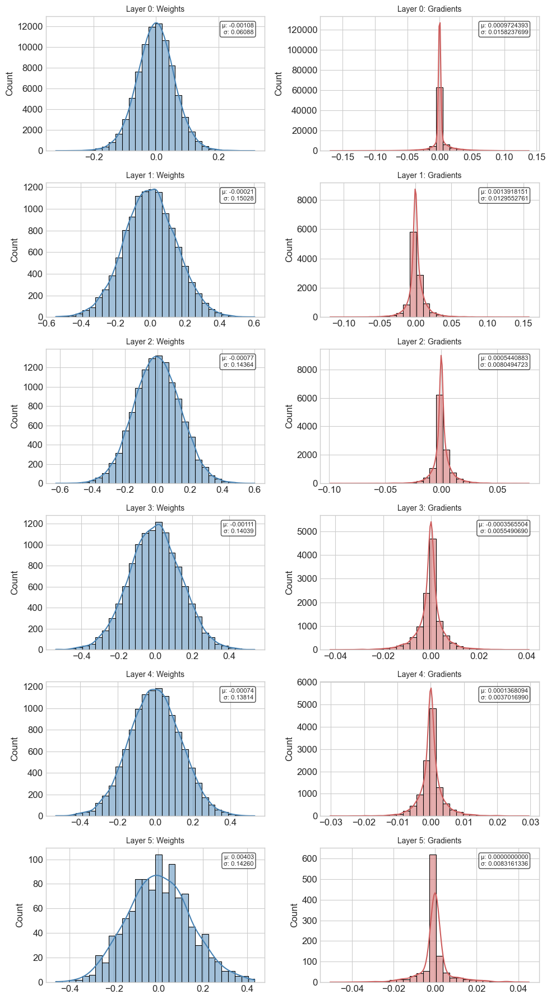

In [ ]:
trained_model_depth2_width3, history_depth2_width3, predictions_depth2_width3, accuracy_depth2_width3, results_depth2_width3 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 5 Layer, Width 108-108-108-108-108",
    hidden_layers=[108, 108, 108, 108, 108],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 3. Depth 3: 7 Layer

#### a. Width 1: 16, 64, 256, 1024, 256, 64, 16


Training Depth 7 Layer, Width 16-64-256-1024-256-64-16 model...
Architecture: [16, 64, 256, 1024, 256, 64, 16], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 2.1395 - val_loss: 1.7294oss: 1.6309
Epoch 2/50 - train_loss: 1.5519 - val_loss: 1.4030oss: 1.4159
Epoch 3/50 - train_loss: 1.3225 - val_loss: 1.2884oss: 1.1118
Epoch 4/50 - train_loss: 1.2394 - val_loss: 1.1853oss: 0.7547
Epoch 5/50 - train_loss: 1.1871 - val_loss: 1.0185oss: 1.1297
Epoch 6/50 - train_loss: 1.0701 - val_loss: 1.0966oss: 0.5778
Epoch 7/50 - train_loss: 1.0374 - val_loss: 0.9284oss: 1.0116
Epoch 8/50 - train_loss: 1.0057 - val_loss: 0.9191oss: 1.1516
Epoch 9/50 - train_loss: 0.9707 - val_loss: 0.8705oss: 0.7863
Epoch 10/50 - train_loss: 0.8934 - val_loss: 0.9679oss: 0.9245
Epoch 11/50 - train_loss: 0.8231 - val_loss: 0.8832oss: 1.0768
Epoch 12/50 - train_loss: 0.8201 - val_loss: 1.05

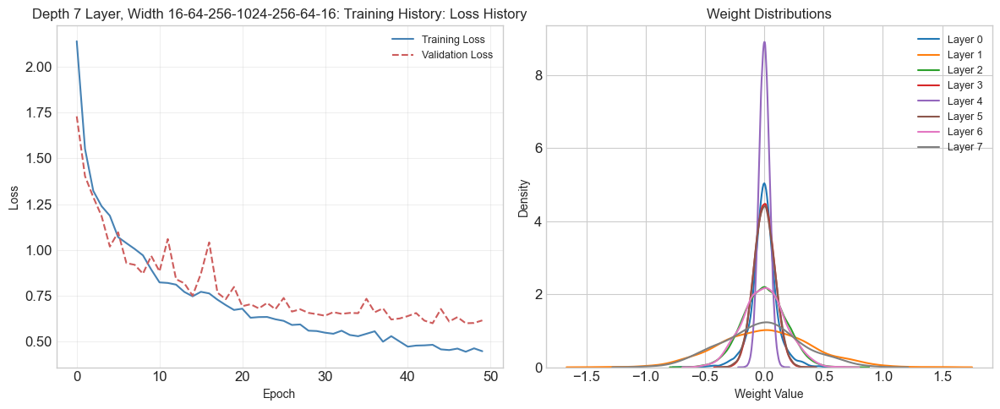

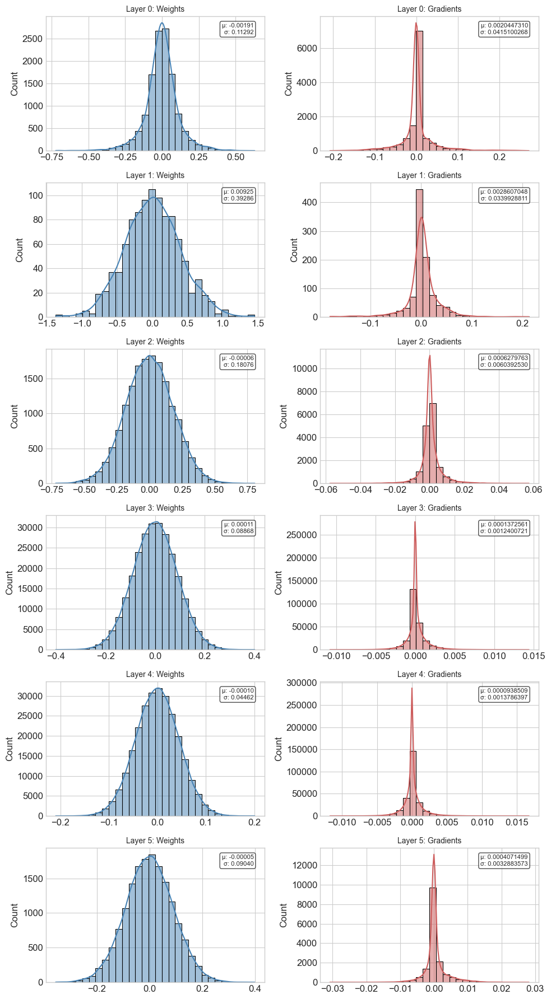

In [ ]:
trained_model_depth3_width1, history_depth3_width1, predictions_depth3_width1, accuracy_depth3_width1, results_depth3_width1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 7 Layer, Width 16-64-256-1024-256-64-16",
    hidden_layers=[16, 64, 256, 1024, 256, 64, 16],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

#### b. Width 2: 1024, 256, 64, 16, 64, 256, 1024


Training Depth 7 Layer, Width 1024-256-64-16-64-256-1024 model...
Architecture: [1024, 256, 64, 16, 64, 256, 1024], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 2.1442 - val_loss: 1.6933oss: 1.7389
Epoch 2/50 - train_loss: 1.2534 - val_loss: 0.9110oss: 0.9080
Epoch 3/50 - train_loss: 0.7647 - val_loss: 0.6703oss: 0.5994
Epoch 4/50 - train_loss: 0.6074 - val_loss: 0.5862oss: 0.7962
Epoch 5/50 - train_loss: 0.5327 - val_loss: 0.5413oss: 0.7144
Epoch 6/50 - train_loss: 0.4809 - val_loss: 0.5415oss: 0.5261
Epoch 7/50 - train_loss: 0.4464 - val_loss: 0.4767oss: 0.3125
Epoch 8/50 - train_loss: 0.4177 - val_loss: 0.4801oss: 0.5098
Epoch 9/50 - train_loss: 0.3870 - val_loss: 0.4522oss: 0.5544
Epoch 10/50 - train_loss: 0.3709 - val_loss: 0.4178oss: 0.4169
Epoch 11/50 - train_loss: 0.3492 - val_loss: 0.4404oss: 0.4887
Epoch 12/50 - train_loss: 0.3359 - val_loss: 

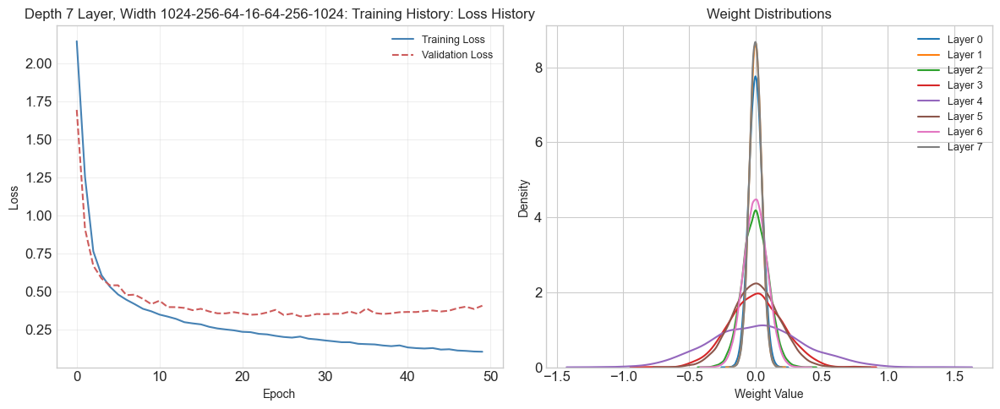

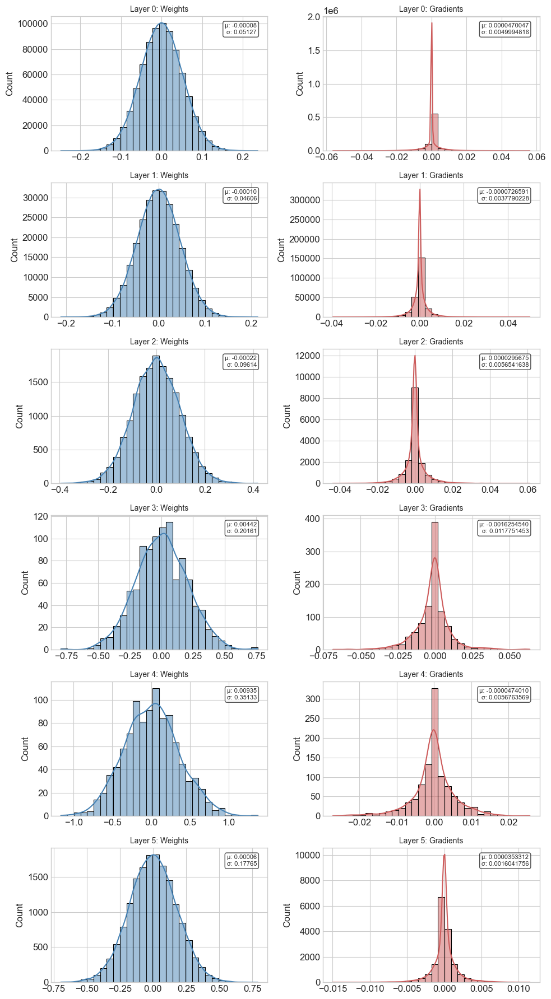

In [ ]:
trained_model_depth3_width2, history_depth3_width2, predictions_depth3_width2, accuracy_depth3_width2, results_depth3_width2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 7 Layer, Width 1024-256-64-16-64-256-1024",
    hidden_layers=[1024, 256, 64, 16, 64, 256, 1024],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

#### c. Width 3: 314, 314, 314, 314, 314, 314, 314


Training Depth 7 Layer with Width 314-314-314-314-314-314-314 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.0001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.8587 - val_loss: 1.3075oss: 1.3106
Epoch 2/50 - train_loss: 2.0393 - val_loss: 2.2892oss: 2.2809
Epoch 3/50 - train_loss: 2.2050 - val_loss: 2.1824oss: 2.1682
Epoch 4/50 - train_loss: 2.1034 - val_loss: 2.0526oss: 2.0836
Epoch 5/50 - train_loss: 1.9666 - val_loss: 1.8809oss: 1.8943
Epoch 6/50 - train_loss: 1.8021 - val_loss: 1.7161oss: 1.8991
Epoch 7/50 - train_loss: 1.6360 - val_loss: 1.5373oss: 1.5030
Epoch 8/50 - train_loss: 1.4733 - val_loss: 1.3795oss: 1.2731
Epoch 9/50 - train_loss: 1.3297 - val_loss: 1.2699oss: 1.4052
Epoch 10/50 - train_loss: 1.2126 - val_loss: 1.1670oss: 0.9603
Epoch 11/50 - train_loss: 1.1108 - val_loss: 1.0709oss: 0.8782
Epoch 12/50 - train_loss: 1.0274 - va

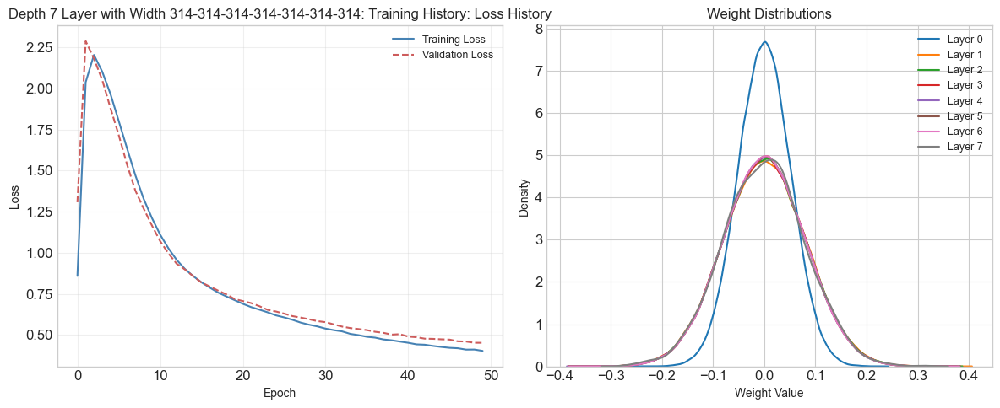

KeyboardInterrupt: 

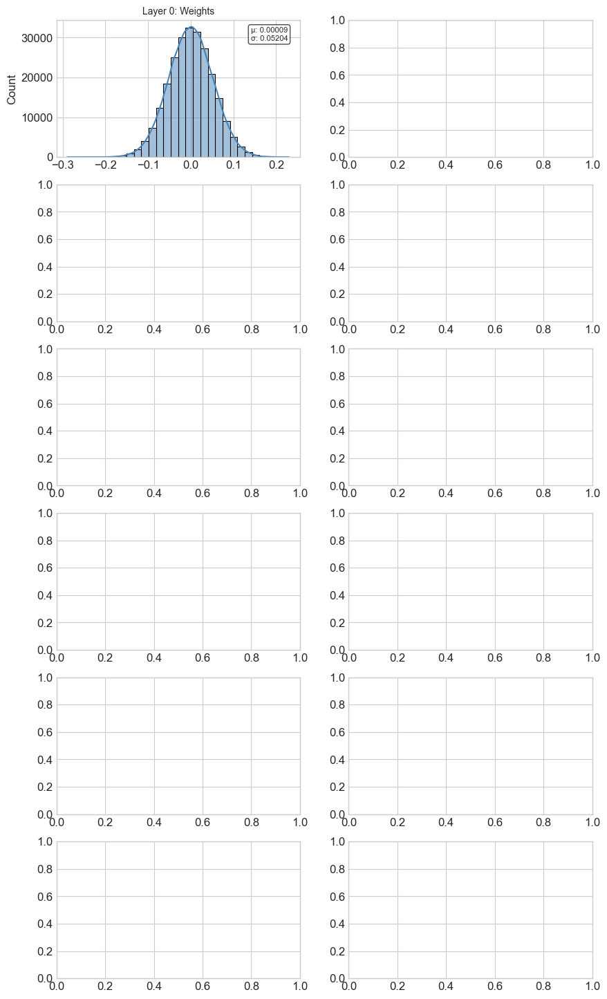

In [ ]:
trained_model_depth3_width3, history_depth3_width3, predictions_depth3_width3, accuracy_depth3_width3, results_depth3_width3 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Depth 7 Layer with Width 314-314-314-314-314-314-314",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Compare

C:\Users\NathanGalung\AppData\Local\Temp\ipykernel_31712\1978388560.py:302: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


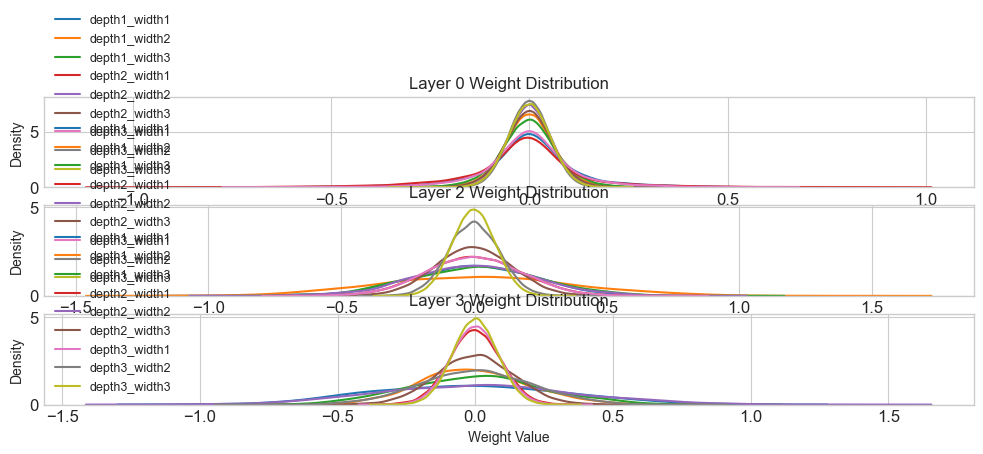

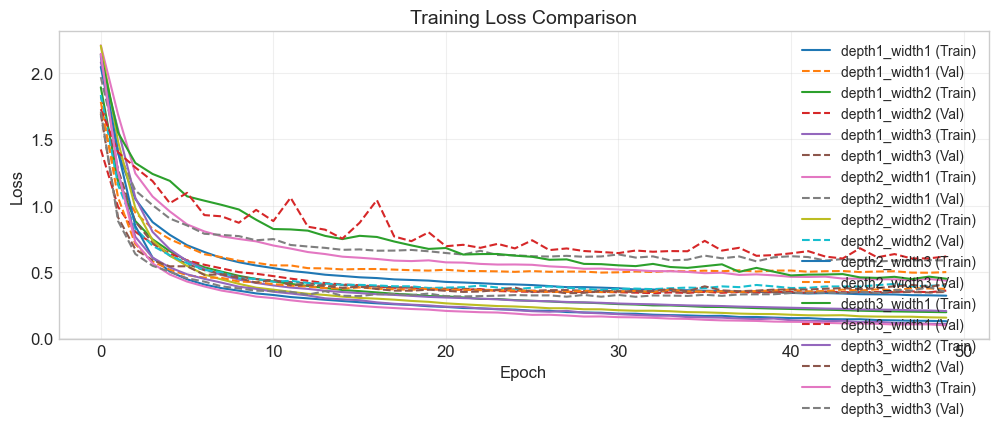

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "depth1_width1": (trained_model_depth1_width1, history_depth1_width1, predictions_depth1_width1, accuracy_depth1_width1),
    "depth1_width2": (trained_model_depth1_width2, history_depth1_width2, predictions_depth1_width2, accuracy_depth1_width2),
    "depth1_width3": (trained_model_depth1_width3, history_depth1_width3, predictions_depth1_width3, accuracy_depth1_width3),
    "depth2_width1": (trained_model_depth2_width1, history_depth2_width1, predictions_depth2_width1, accuracy_depth2_width1),
    "depth2_width2": (trained_model_depth2_width2, history_depth2_width2, predictions_depth2_width2, accuracy_depth2_width2),
    "depth2_width3": (trained_model_depth2_width3, history_depth2_width3, predictions_depth2_width3, accuracy_depth2_width3),
    "depth3_width1": (trained_model_depth3_width1, history_depth3_width1, predictions_depth3_width1, accuracy_depth3_width1),
    "depth3_width2": (trained_model_depth3_width2, history_depth3_width2, predictions_depth3_width2, accuracy_depth3_width2),
    "depth3_width3": (trained_model_depth3_width3, history_depth3_width3, predictions_depth3_width3, accuracy_depth3_width3)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Activation Function

The neural network implementation supports the following activation functions:  

- **Linear**: $f(x) = x$ 
  Derivative: $\frac{d}{dx}\text{Linear}(x) = 1$  

- **ReLU**: $f(x) = \max(0, x)$
  Derivative: $\frac{d}{dx}\text{ReLU}(x) =   
  \begin{cases}   
  0 & \text{if } x \leq 0 \\   
  1 & \text{if } x > 0   
  \end{cases}$

- **Sigmoid**: $f(x) = \frac{1}{1 + e^{-x}}$
  Derivative: $\frac{d}{dx} \sigma(x) = \sigma(x)(1 - \sigma(x))$

- **Tanh**: $f(x) = \frac{e^x - e^{-x}}{e^x + e^{-x}}$
  Derivative: $\frac{d}{dx}\text{tanh}(x) = \frac{2}{(e^x - e^{-x})^2}$  

- **Softmax**: $f(x_i) = \frac{e^{x_i}}{\sum_{j=1}^n e^{x_j}}$
  Derivative: $\frac{d(\text{softmax}(\mathbf{x}))_i}{dx_j} =   
  \begin{cases}   
  \text{softmax}(\mathbf{x})_i(1 - \text{softmax}(\mathbf{x})_i) & \text{if } i = j \\   
  -\text{softmax}(\mathbf{x})_i \cdot \text{softmax}(\mathbf{x})_j & \text{if } i \neq j
  \end{cases}$ 

### Linear

In [ ]:
trained_model_activation_linear, history_activation_linear, predictions_activation_linear, accuracy_activation_linear, results_activation_linear = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Linear",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='linear',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)


Training Activation Function Linear model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: linear, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 1.5770 - val_loss: 0.6027oss: 0.5522
Epoch 2/50 - train_loss: 0.4869 - val_loss: 0.4917oss: 0.2788
Epoch 3/50 [#-------------------] 6.8% - batch_loss: 0.6476

KeyboardInterrupt: 

### ReLU

In [ ]:
trained_model_activation_relu, history_activation_relu, predictions_activation_relu, accuracy_activation_relu, results_activation_relu = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function ReLU",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)


Training Activation Function ReLU model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 2.1472 - val_loss: 1.7105oss: 1.8222
Epoch 2/50 - train_loss: 1.2506 - val_loss: 0.8831oss: 0.5783
Epoch 3/50 - train_loss: 0.7235 - val_loss: 0.6345oss: 0.6390
Epoch 4/50 - train_loss: 0.5633 - val_loss: 0.5451oss: 0.4030
Epoch 5/50 - train_loss: 0.4793 - val_loss: 0.5005oss: 0.1944
Epoch 6/50 - train_loss: 0.4258 - val_loss: 0.4511oss: 0.3408
Epoch 7/50 - train_loss: 0.3890 - val_loss: 0.4257oss: 0.3776
Epoch 8/50 - train_loss: 0.3577 - val_loss: 0.3900oss: 0.5143
Epoch 9/50 - train_loss: 0.3369 - val_loss: 0.3740oss: 0.2812
Epoch 10/50 - train_loss: 0.3125 - val_loss: 0.3571oss: 0.2404
Epoch 11/50 - train_loss: 0.3010 - val_loss: 0.3537oss: 0.1710
Epoch 12/50 - train_loss: 0.2845 - val_loss: 0.3485oss: 0.2249
Epoc

KeyboardInterrupt: 

### Sigmoid


Training Activation Function Sigmoid model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: sigmoid, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 1.8377 - val_loss: 1.3780oss: 1.7504
Epoch 2/5 - train_loss: 1.0180 - val_loss: 0.8022oss: 1.3021
Epoch 3/5 - train_loss: 0.6966 - val_loss: 0.6317oss: 0.4775
Epoch 4/5 - train_loss: 0.5460 - val_loss: 0.5029oss: 0.1382
Epoch 5/5 - train_loss: 0.4580 - val_loss: 0.4439oss: 0.0604
Test accuracy: 0.8729

Model Evaluation Results:
Accuracy: 0.8729


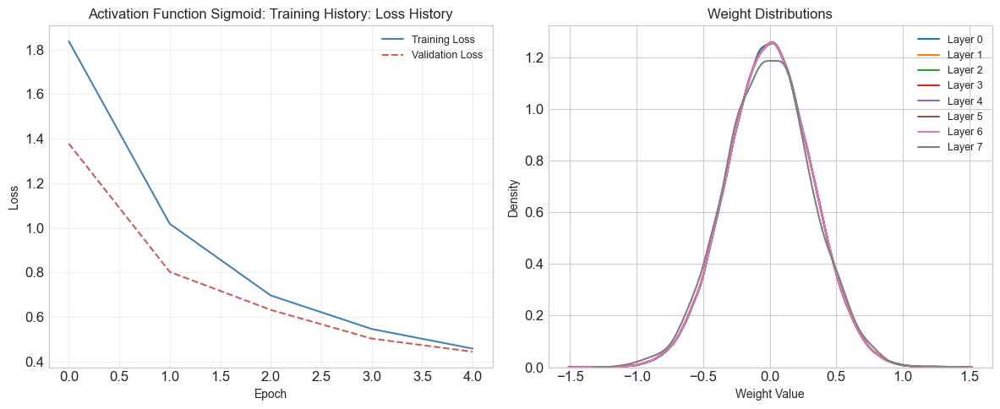

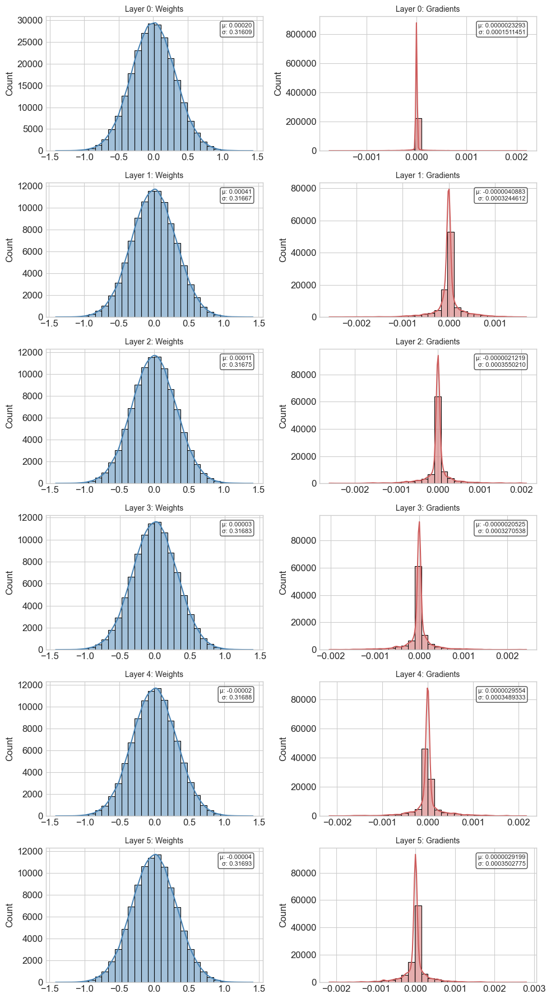

In [ ]:
trained_model_activation_sigmoid, history_activation_sigmoid, predictions_activation_sigmoid, accuracy_activation_sigmoid, results_activation_sigmoid = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Sigmoid",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='sigmoid',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Hyperbolic Tangent (TanH)


Training Activation Function TanH model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: tanh, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 9.4625 - val_loss: 9.0352oss: 10.6571
Epoch 2/5 - train_loss: 8.5073 - val_loss: 7.6289oss: 13.6485
Epoch 3/5 - train_loss: 7.7418 - val_loss: 8.1242oss: 5.9273
Epoch 4/5 - train_loss: 7.1724 - val_loss: 6.1910oss: 10.5743
Epoch 5/5 - train_loss: 5.9299 - val_loss: 5.5368oss: 4.03787
Test accuracy: 0.4886

Model Evaluation Results:
Accuracy: 0.4886


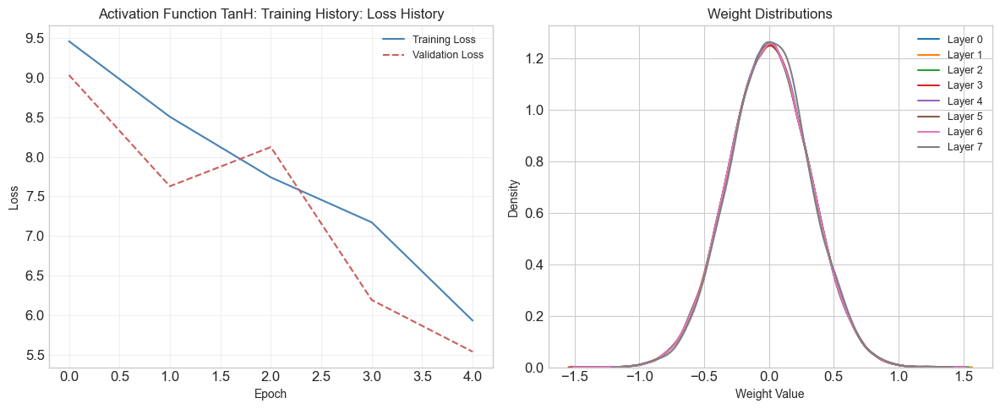

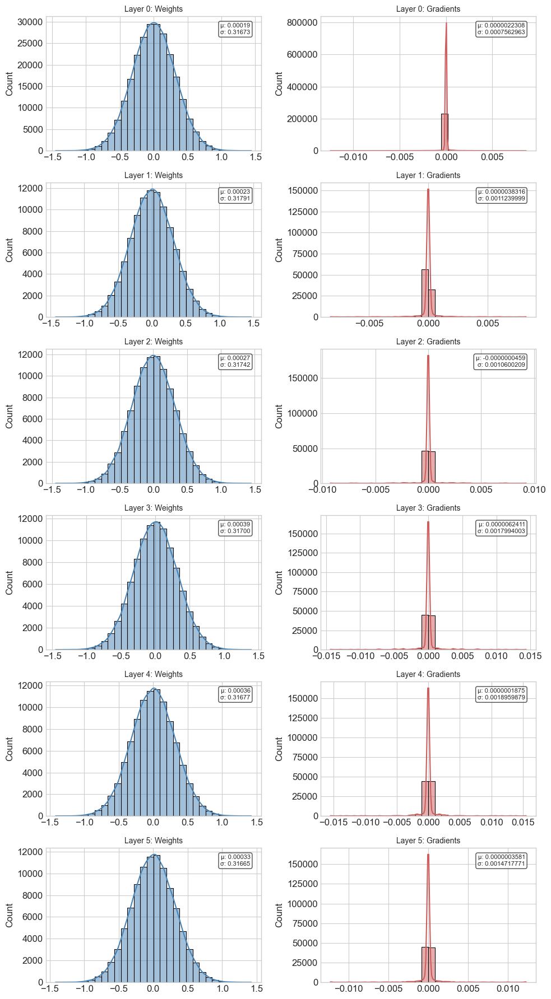

In [ ]:
trained_model_activation_tanh, history_activation_tanh, predictions_activation_tanh, accuracy_activation_tanh, results_activation_tanh = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function TanH",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='tanh',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Softmax


Training Activation Function Softmax model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: softmax, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


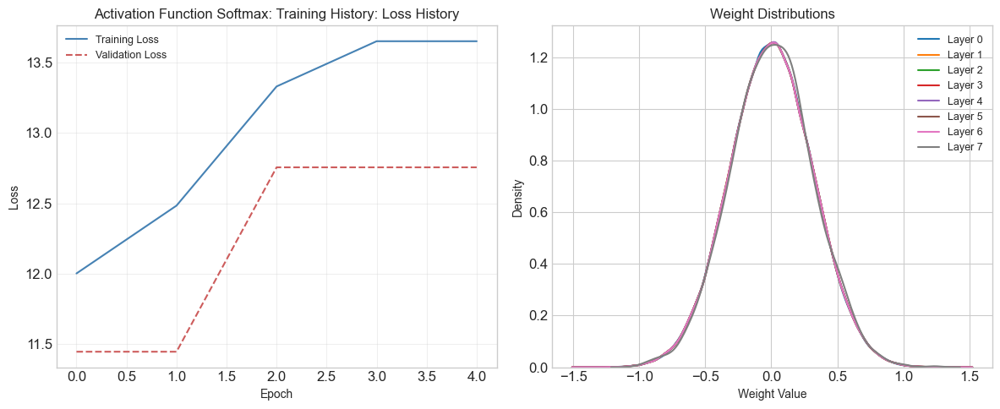

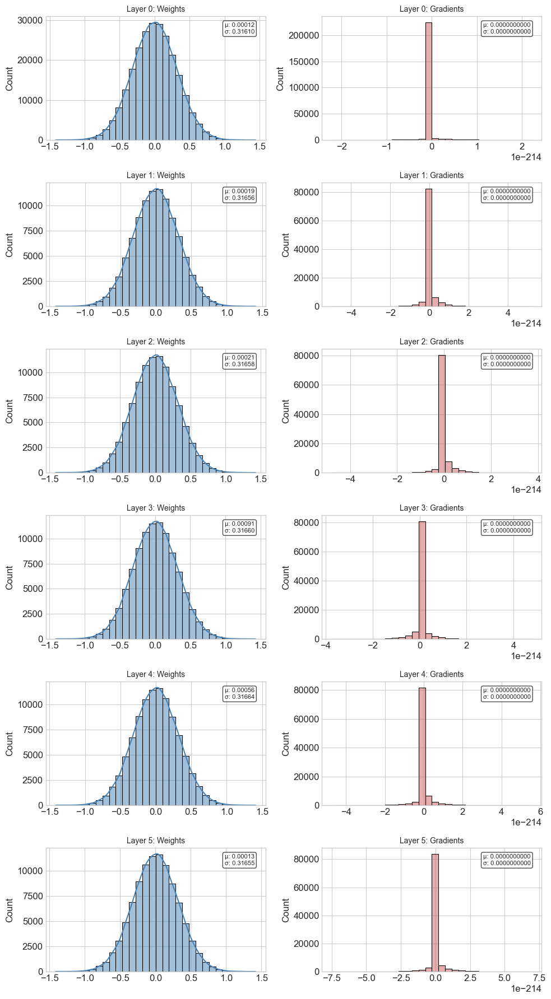

In [ ]:
trained_model_activation_softmax, history_activation_softmax, predictions_activation_softmax, accuracy_activation_softmax, results_activation_softmax = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Softmax",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='softmax',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Softplus


Training Activation Function Softplus model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: softplus, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight Init: he
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 2.8953 - val_loss: 1.2032oss: 0.0736
Epoch 2/5 - train_loss: 0.9211 - val_loss: 0.6907oss: 0.0001
Epoch 3/5 - train_loss: 0.5954 - val_loss: 0.5080oss: 0.2945
Epoch 4/5 - train_loss: 0.4938 - val_loss: 0.5114oss: 3.0166
Epoch 5/5 - train_loss: 0.4462 - val_loss: 0.4803oss: 0.0514
Test accuracy: 0.8700

Model Evaluation Results:
Accuracy: 0.8700


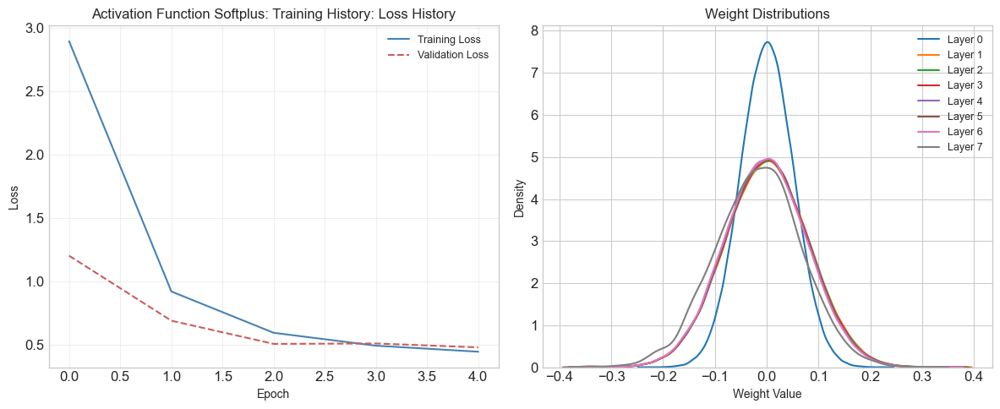

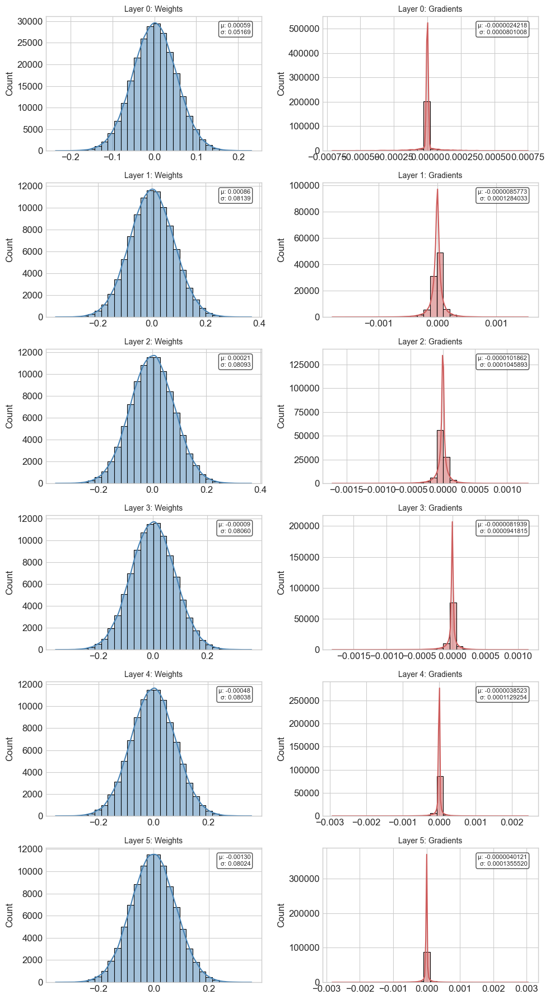

In [ ]:
trained_model_activation_softplus, history_activation_softplus, predictions_activation_softplus, accuracy_activation_softplus, results_activation_softplus = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function Softplus",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='softplus',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### ELU


Training Activation Function ELU model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: elu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 11.4154 - val_loss: 12.8287s: 0.00008
Epoch 2/5 - train_loss: 13.7230 - val_loss: 12.8287s: 0.0000
Epoch 3/5 - train_loss: 13.7230 - val_loss: 12.8287s: 34.5388
Epoch 4/5 - train_loss: 13.7230 - val_loss: 12.8287s: 0.0000
Epoch 5/5 - train_loss: 13.7230 - val_loss: 12.8287s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


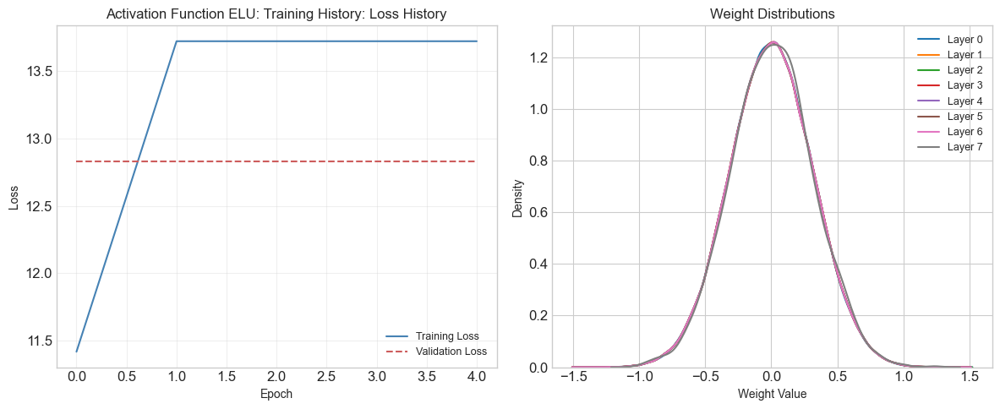

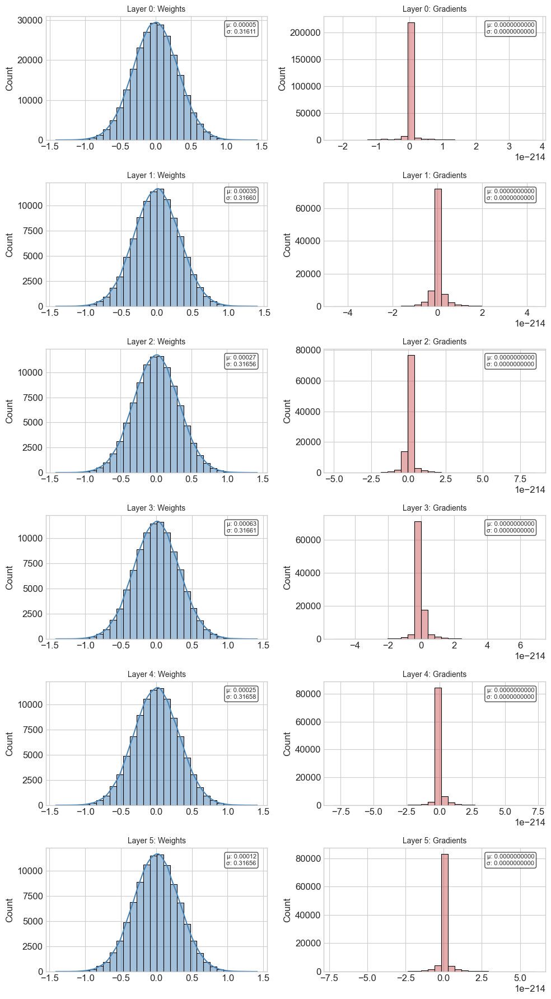

In [ ]:
trained_model_activation_elu, history_activation_elu, predictions_activation_elu, accuracy_activation_elu, results_activation_elu = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Activation Function ELU",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='elu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Compare

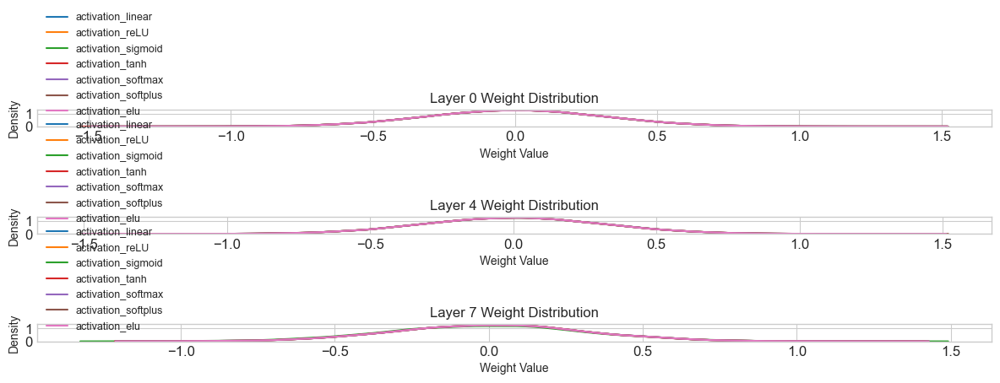

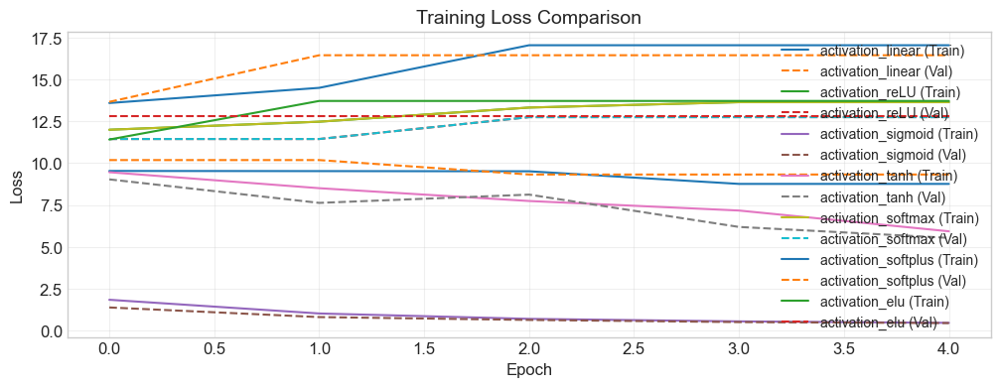

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "activation_linear": (trained_model_activation_linear, history_activation_linear, predictions_activation_linear, accuracy_activation_linear),
    "activation_relu": (trained_model_activation_relu, history_activation_relu, predictions_activation_relu, accuracy_activation_relu),
    "activation_sigmoid": (trained_model_activation_sigmoid, history_activation_sigmoid, predictions_activation_sigmoid, accuracy_activation_sigmoid),
    "activation_tanh": (trained_model_activation_tanh, history_activation_tanh, predictions_activation_tanh, accuracy_activation_tanh),
    "activation_softmax": (trained_model_activation_softmax, history_activation_softmax, predictions_activation_softmax, accuracy_activation_softmax),
    "activation_softplus": (trained_model_activation_softplus, history_activation_softplus, predictions_activation_softplus, accuracy_activation_softplus),
    "activation_elu": (trained_model_activation_elu, history_activation_elu, predictions_activation_elu, accuracy_activation_elu)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Output Activation

### Sigmoid

In [ ]:
trained_model_output_activate_sigmoid, history_output_activate_sigmoid, predictions_output_activate_sigmoid, accuracy_output_activate_sigmoid, results_output_activate_sigmoid = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Output Activation Sigmoid",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='sigmoid',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)


Training Output Activation Sigmoid model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight Init: he
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 [--------------------] 1.1% - batch_loss: 2.6606

KeyboardInterrupt: 

### Softmax

In [ ]:
trained_model_output_activate_softmax, history_output_activate_softmax, predictions_output_activate_softmax, accuracy_output_activate_softmax, results_output_activate_softmax = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Output Activation Softmax",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)



Training Output Activation Softmax model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight Init: he
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 [--------------------] 4.4% - batch_loss: 1.9872

KeyboardInterrupt: 

### Compare

In [ ]:
# Compare multiple models at once
models_dict = {
    "output_activate_sigmoid": (trained_model_output_activate_sigmoid, history_output_activate_sigmoid, predictions_output_activate_sigmoid, accuracy_output_activate_sigmoid),
    "output_activate_softmax": (trained_model_output_activate_softmax, history_output_activate_softmax, predictions_output_activate_softmax, accuracy_output_activate_softmax)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Learning Rate

### 0.01


Training Learning Rate 0.001 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


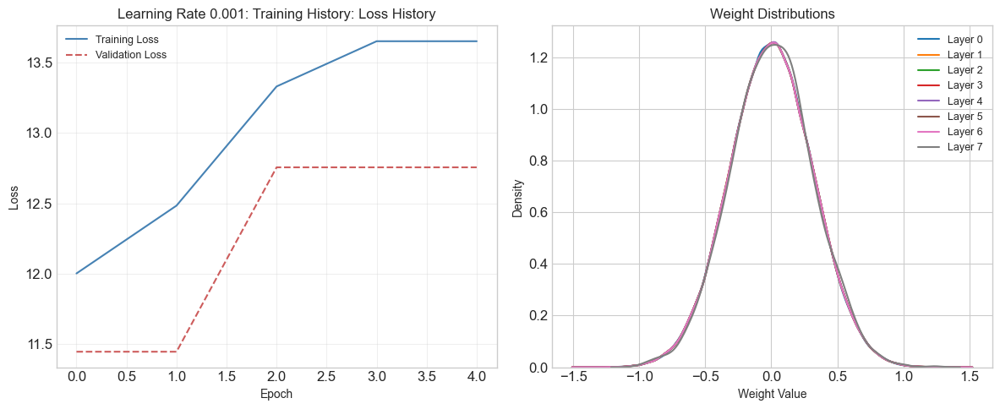

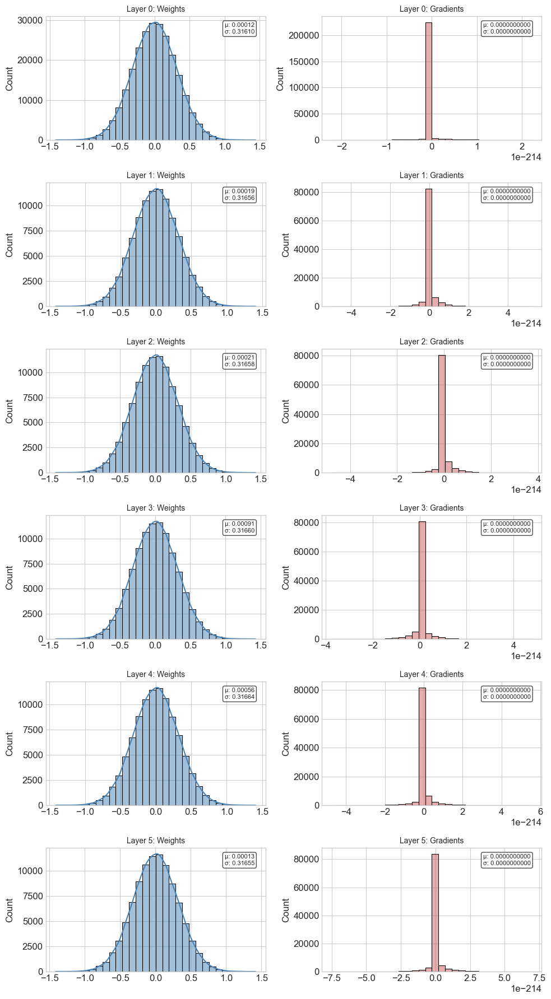

In [ ]:
trained_model_lr_0001, history_lr_0001, predictions_lr_0001, accuracy_lr_0001, results_lr_0001 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Learning Rate 0.01",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.01,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 0.001


Training Learning Rate 0.0005 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.0005, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.0005, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 13.9461 - val_loss: 13.4455s: 0.00008
Epoch 2/5 - train_loss: 14.0622 - val_loss: 13.4455s: 0.0000
Epoch 3/5 - train_loss: 14.0622 - val_loss: 13.4455s: 34.5388
Epoch 4/5 - train_loss: 14.0622 - val_loss: 13.4455s: 34.5388
Epoch 5/5 - train_loss: 14.0622 - val_loss: 13.4455s: 0.00008
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


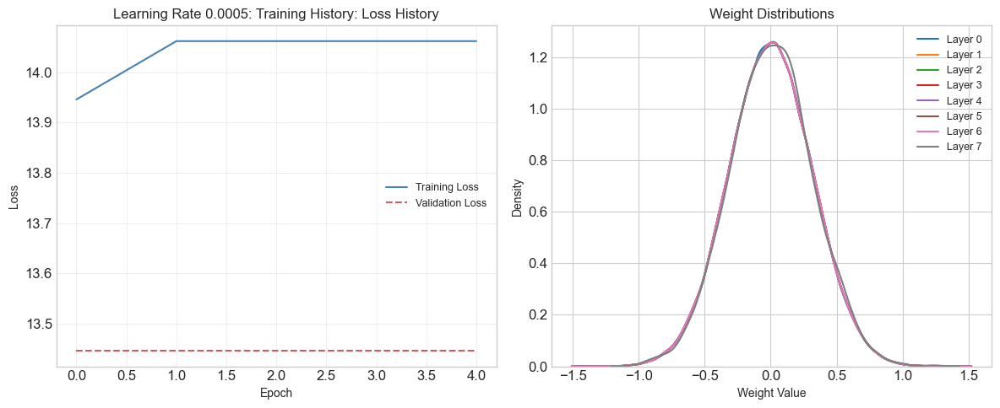

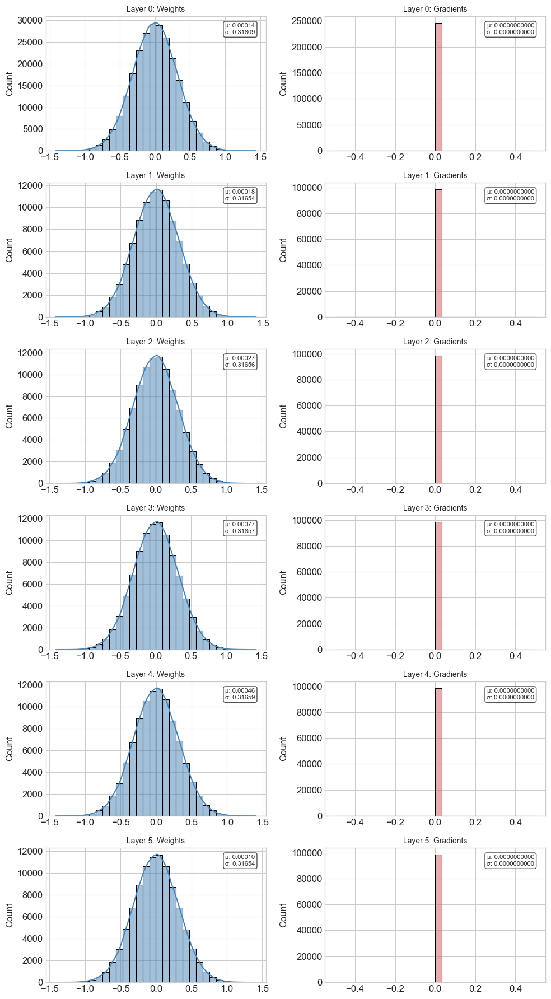

In [ ]:
trained_model_lr_00005, history_lr_00005, predictions_lr_00005, accuracy_lr_00005, results_lr_00005 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Learning Rate 0.001",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### 0.0001


Training Learning Rate 0.0001 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.0001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.4093 - val_loss: 14.3089s: 0.00008
Epoch 2/5 - train_loss: 17.3665 - val_loss: 18.2069s: 0.00008
Epoch 3/5 - train_loss: 18.1919 - val_loss: 18.8730s: 34.5388
Epoch 4/5 - train_loss: 20.1497 - val_loss: 22.0308s: 34.5388
Epoch 5/5 - train_loss: 23.6776 - val_loss: 24.0291s: 34.5388
Test accuracy: 0.1136

Model Evaluation Results:
Accuracy: 0.1136


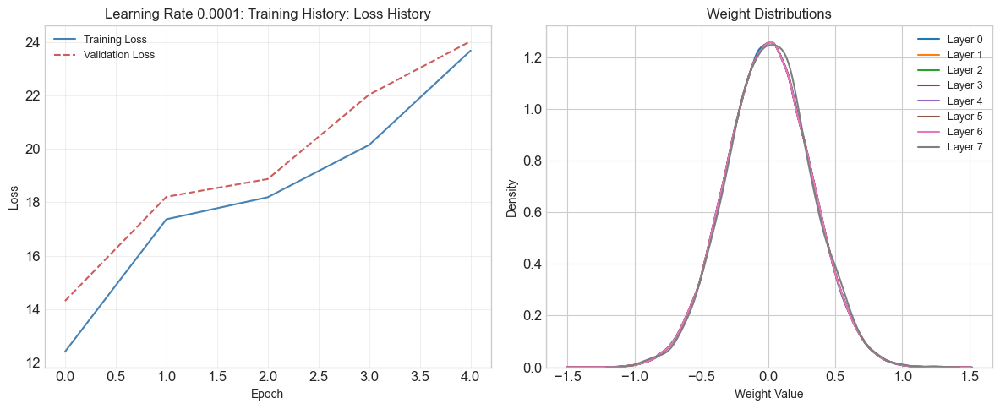

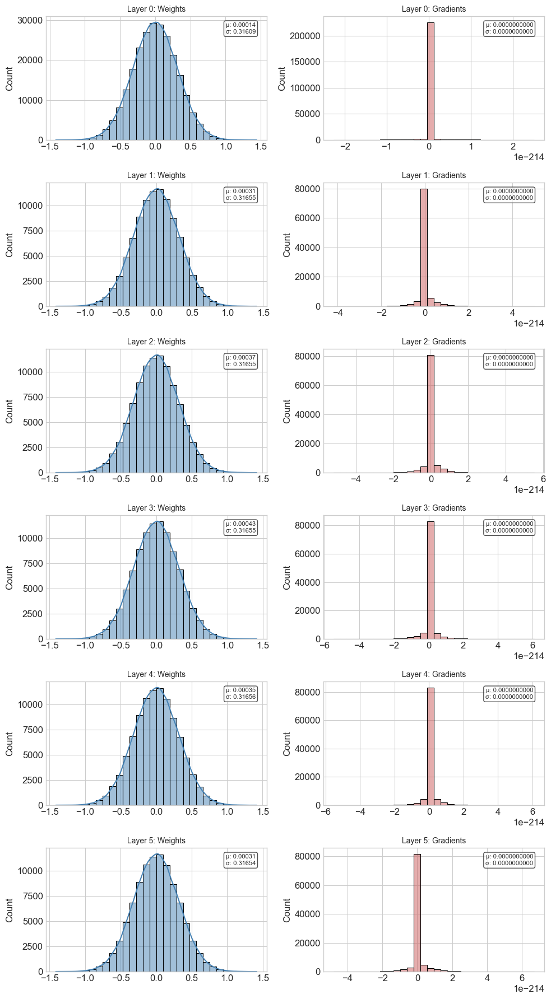

In [ ]:
trained_model_lr_00001, history_lr_00001, predictions_lr_00001, accuracy_lr_00001, results_lr_00001 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Learning Rate 0.0001",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.0001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Compare

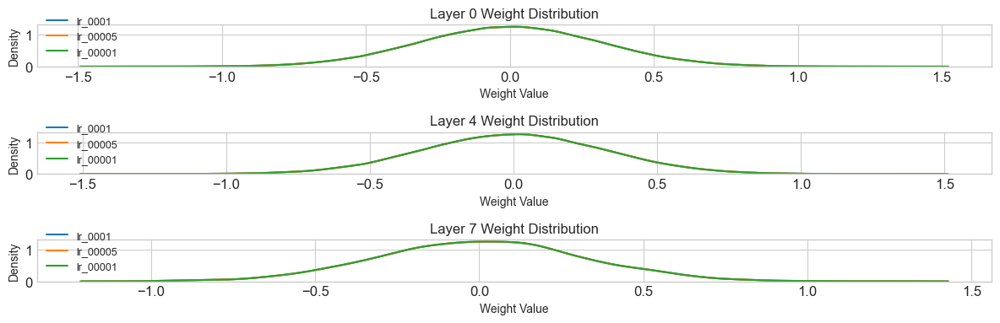

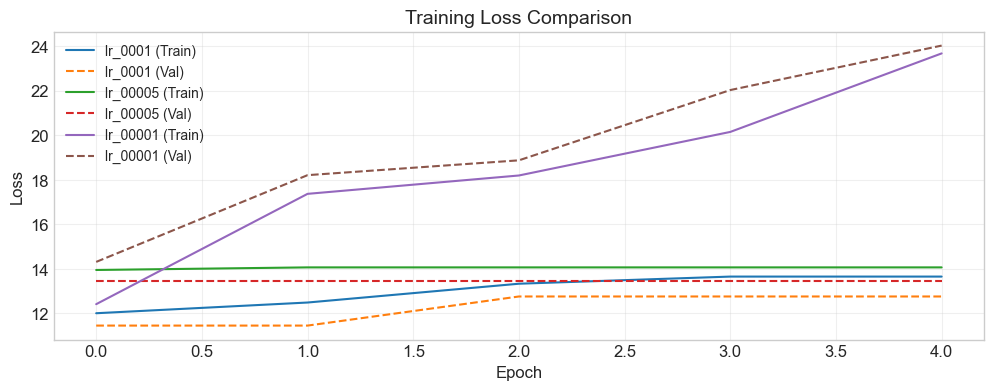

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "lr_0001": (trained_model_lr_0001, history_lr_0001, predictions_lr_0001, accuracy_lr_0001),
    "lr_00005": (trained_model_lr_00005, history_lr_00005, predictions_lr_00005, accuracy_lr_00005),
    "lr_00001": (trained_model_lr_00001, history_lr_00001, predictions_lr_00001, accuracy_lr_00001)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Loss Function

The following loss functions are implemented:

- **Mean Squared Error**: 
  $\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_{\text{true}, i} - y_{\text{pred}, i})^2$

- **Binary Cross-Entropy**:
  $\text{BCE} = -\frac{1}{n} \sum_{i=1}^{n} \left[ y_{\text{true}, i} \log(y_{\text{pred}, i}) + (1 - y_{\text{true}, i}) \log(1 - y_{\text{pred}, i}) \right]$

- **Categorical Cross-Entropy**: 
  $\text{CCE} = -\frac{1}{n} \sum_{i=1}^{n} \sum_{j=1}^{C} y_{\text{true}, i, j} \log(y_{\text{pred}, i, j})$

### Mean Squared Error

$\text{MSE} = \frac{1}{n} \sum_{i=1}^{n} (y_{\text{true}, i} - y_{\text{pred}, i})^2$


Training Loss Function MSE model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: mean_squared_error, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


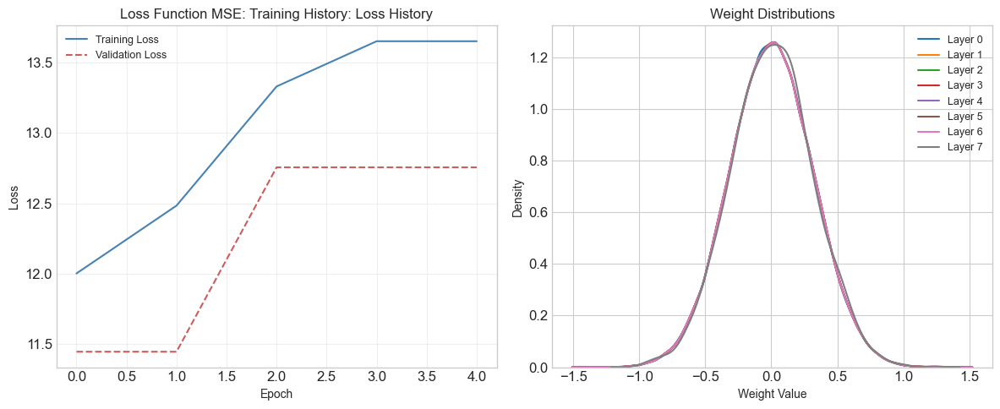

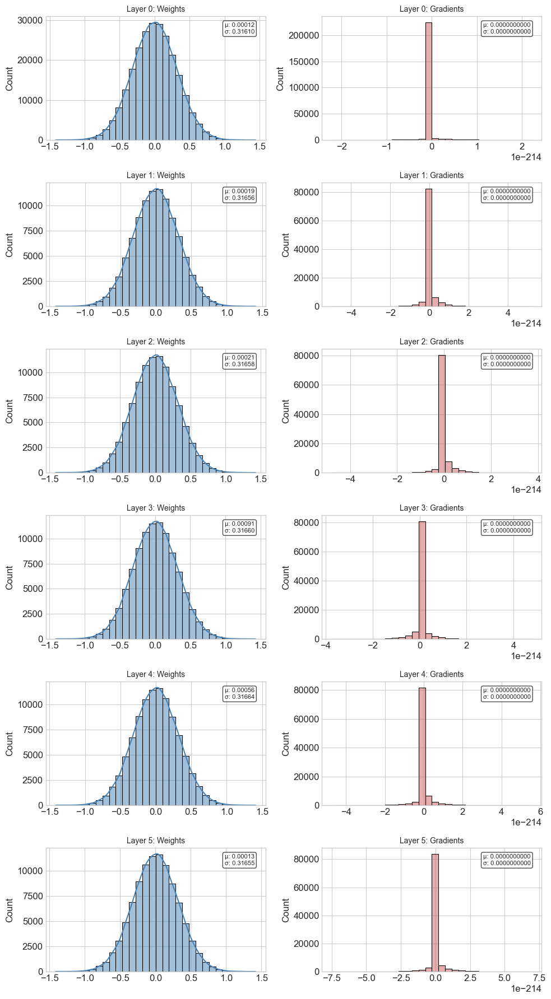

In [ ]:
trained_model_loss_mse, history_loss_mse, predictions_loss_mse, accuracy_loss_mse, results_loss_mse = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Loss Function MSE",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='mean_squared_error',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### BCE


Training Loss Function BCE model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: binary_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 19.8978 - val_loss: 20.1119s: 24.1776
Epoch 2/5 - train_loss: 20.0280 - val_loss: 20.1119s: 24.1776
Epoch 3/5 - train_loss: 20.0280 - val_loss: 20.1119s: 24.1776
Epoch 4/5 - train_loss: 20.0280 - val_loss: 20.1119s: 17.2698
Epoch 5/5 - train_loss: 20.0280 - val_loss: 20.1119s: 17.2698
Test accuracy: 0.1136

Model Evaluation Results:
Accuracy: 0.1136


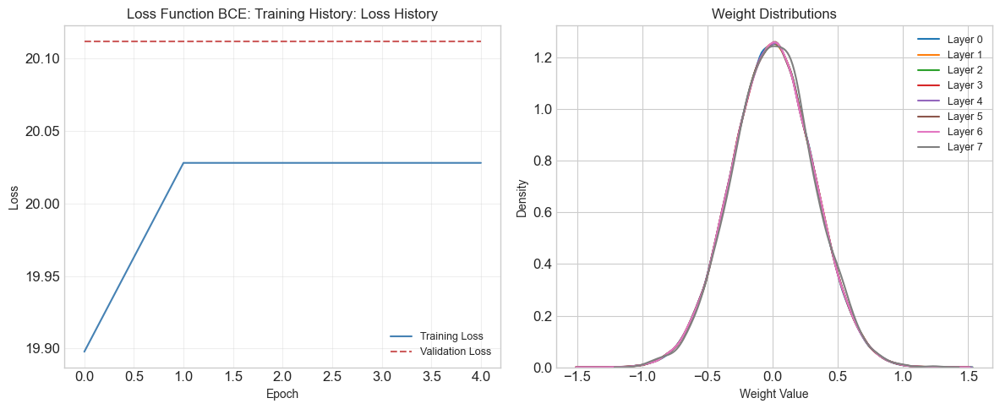

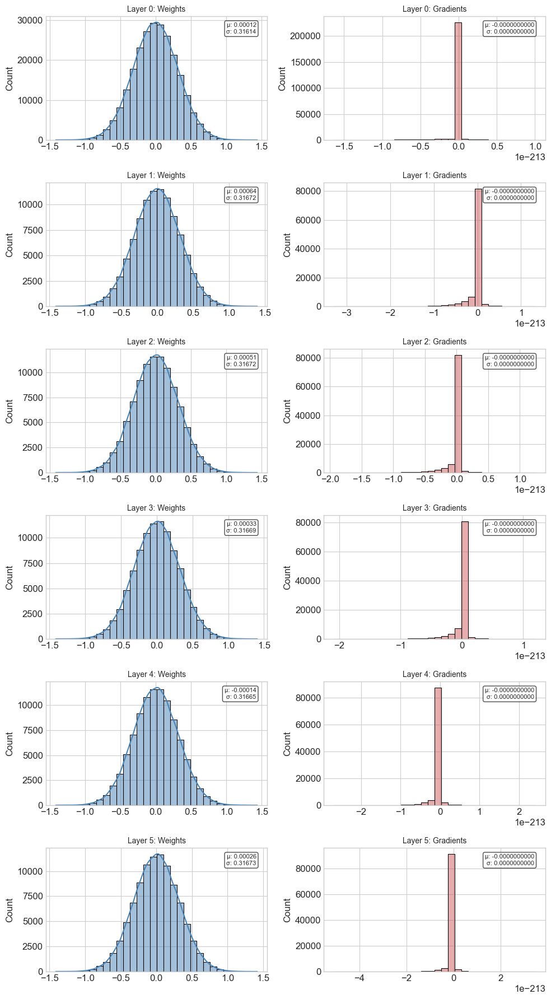

In [ ]:
trained_model_loss_bce, history_loss_bce, predictions_loss_bce, accuracy_loss_bce, results_loss_bce = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Loss Function BCE",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='binary_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### CCE


Training Loss Function CCE model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: cateogrical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


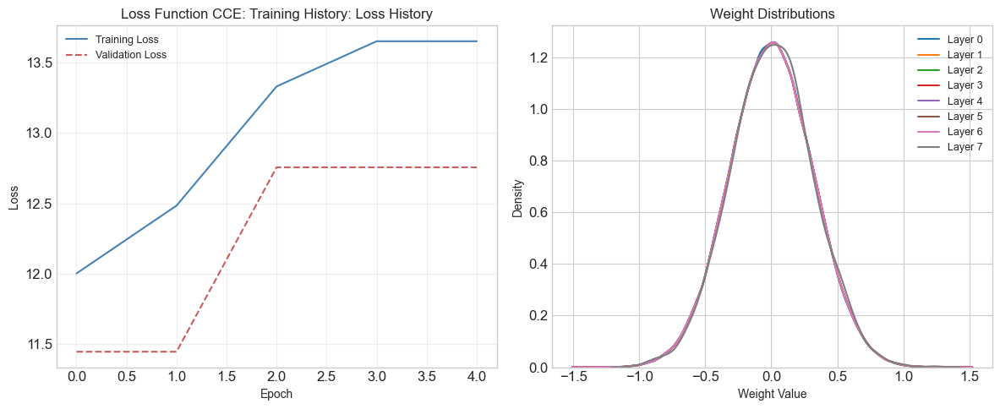

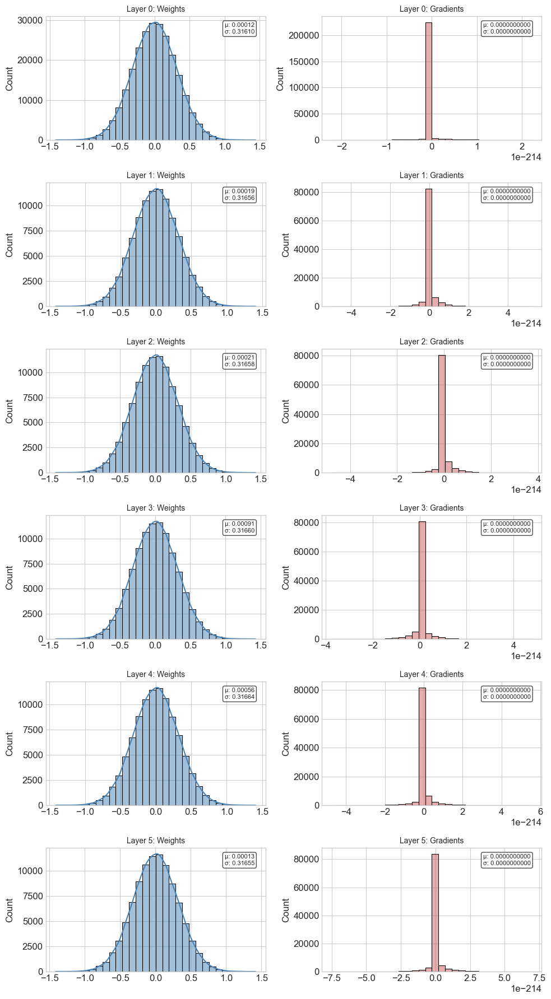

In [ ]:
trained_model_loss_cce, history_loss_cce, predictions_loss_cce, accuracy_loss_cce, results_loss_cce = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Loss Function CCE",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Compare

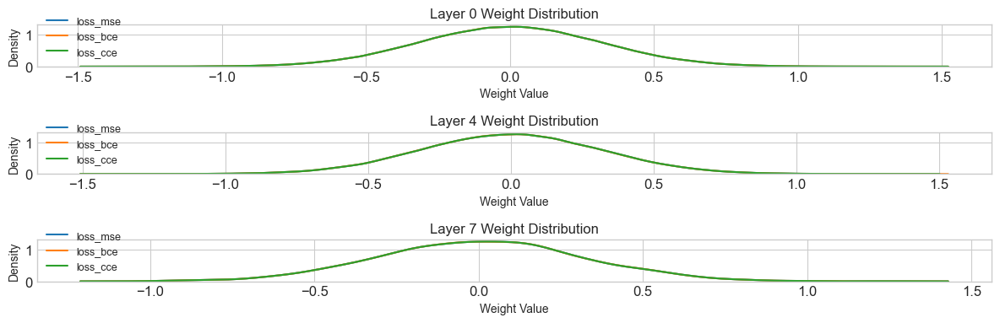

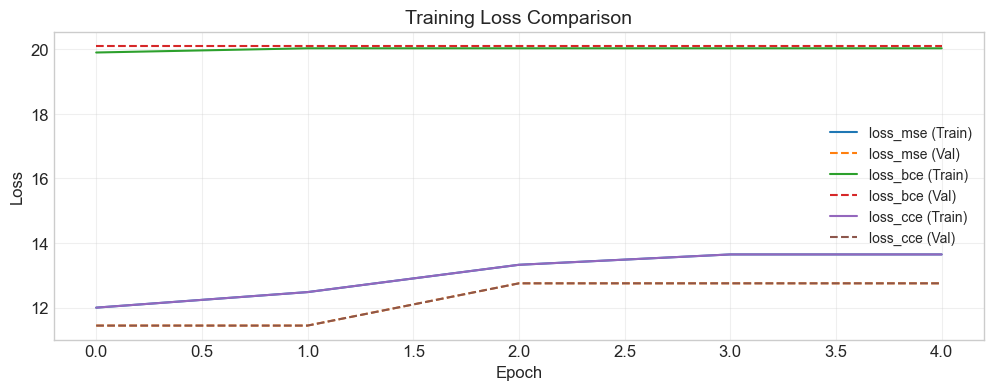

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "loss_mse": (trained_model_loss_mse, history_loss_mse, predictions_loss_mse, accuracy_loss_mse),
    "loss_bce": (trained_model_loss_bce, history_loss_bce, predictions_loss_bce, accuracy_loss_bce),
    "loss_cce": (trained_model_loss_cce, history_loss_cce, predictions_loss_cce, accuracy_loss_cce)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Weight Initialization

### Zero


Training Weight Initialization Zero model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: zero
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


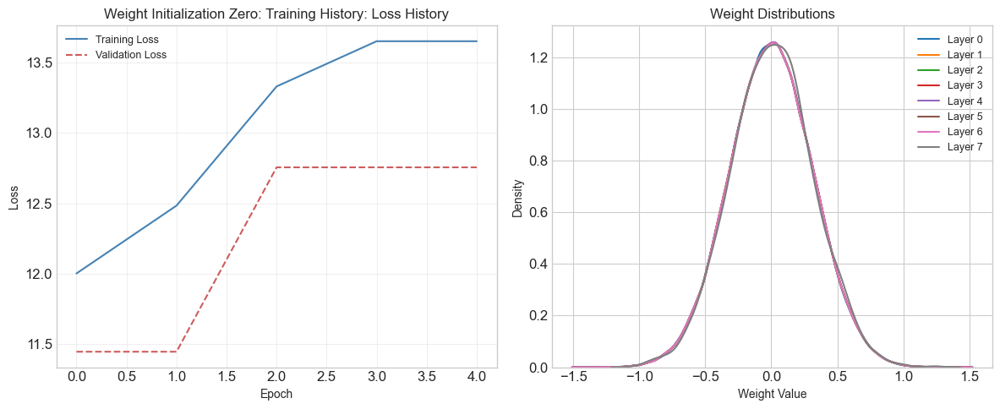

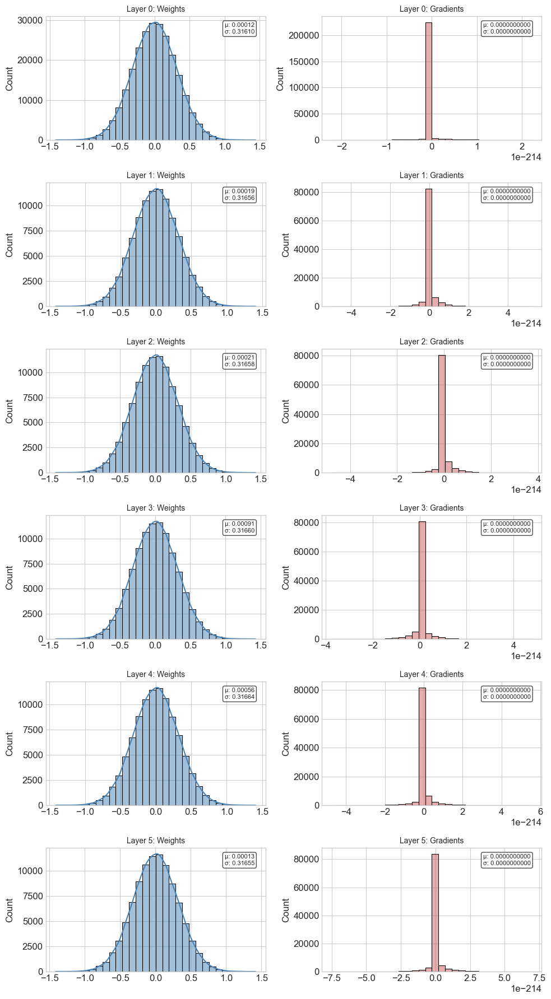

In [ ]:
trained_model_weight_zero, history_weight_zero, predictions_weight_zero, accuracy_weight_zero, results_weight_zero = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Zero",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='zero',
    regularization_type='none',
    normalization_type='none',
)

### Random Uniform


Training Weight Initialization Random Uniform model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: random_uniform
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


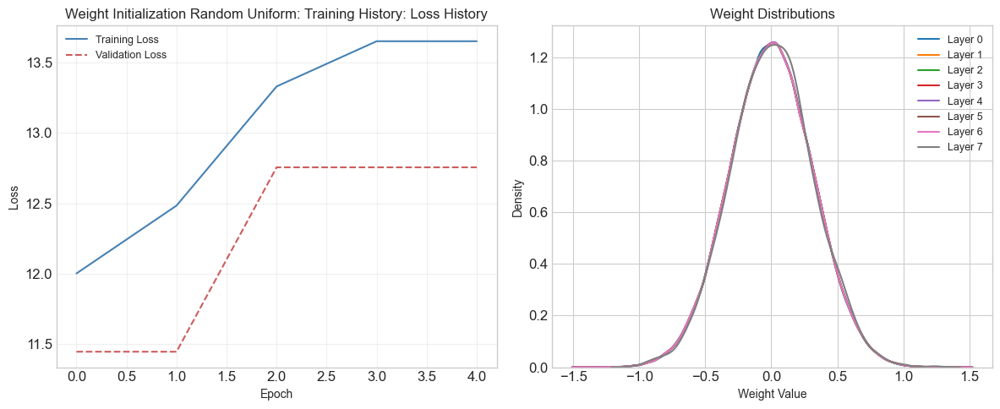

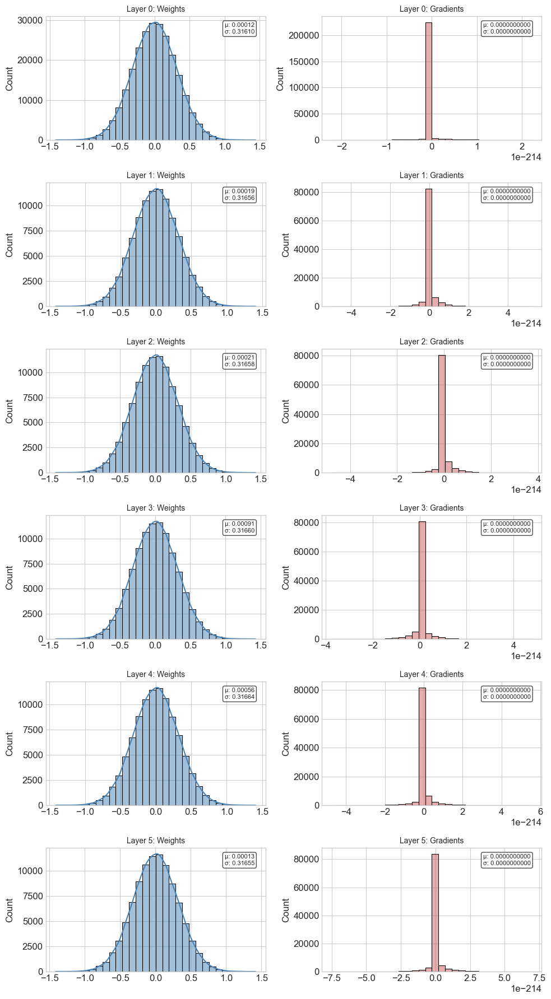

In [ ]:
trained_model_weight_random_uniform, history_weight_random_uniform, predictions_weight_random_uniform, accuracy_weight_random_uniform, results_weight_random_uniform = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Random Uniform",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='random_uniform',
    regularization_type='none',
    normalization_type='none',
)

### Random Normal


Training Weight Initialization Random Normal model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: random_normal
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


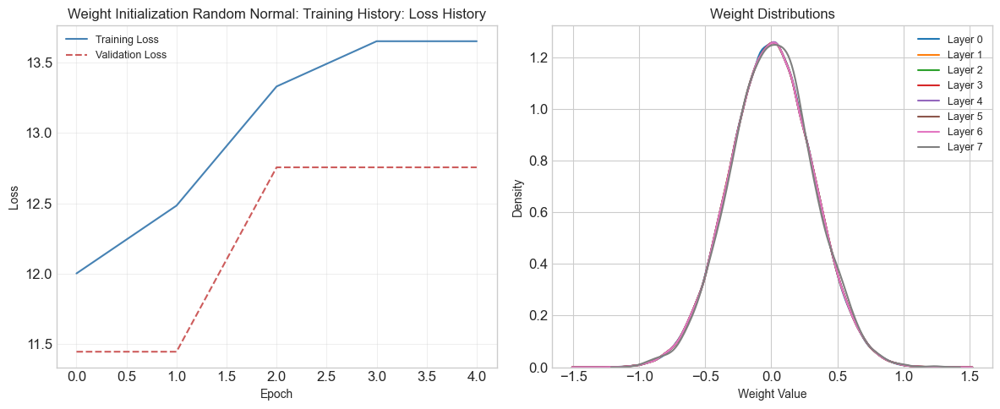

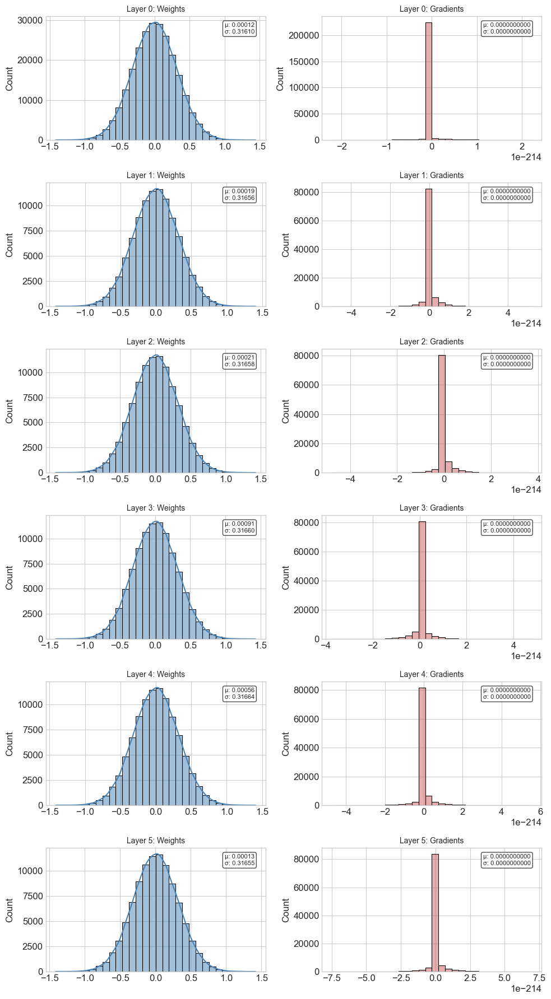

In [ ]:
trained_model_weight_random_normal, history_weight_random_normal, predictions_weight_random_normal, accuracy_weight_random_normal, results_weight_random_normal = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Random Normal",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='random_normal',
    regularization_type='none',
    normalization_type='none',
)

### Xavier


Training Weight Initialization Xavier model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: xavier
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


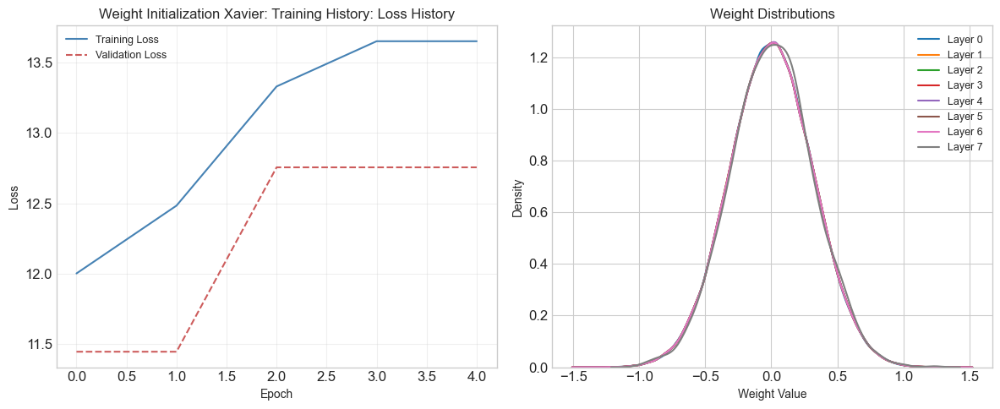

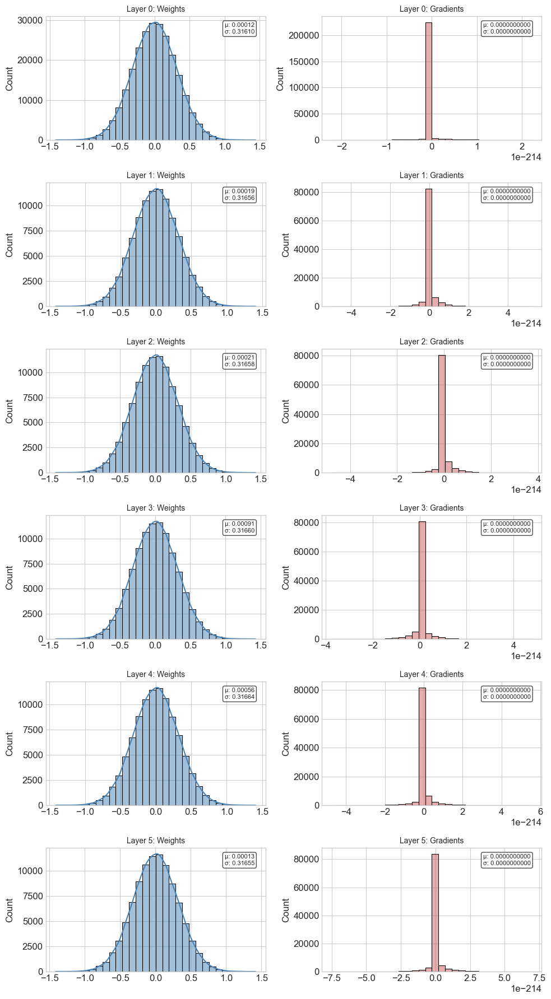

In [ ]:
trained_model_weight_xavier, history_weight_xavier, predictions_weight_xavier, accuracy_weight_xavier, results_weight_xavier = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization Xavier",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='xavier',
    regularization_type='none',
    normalization_type='none',
)

### He


Training Weight Initialization He model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


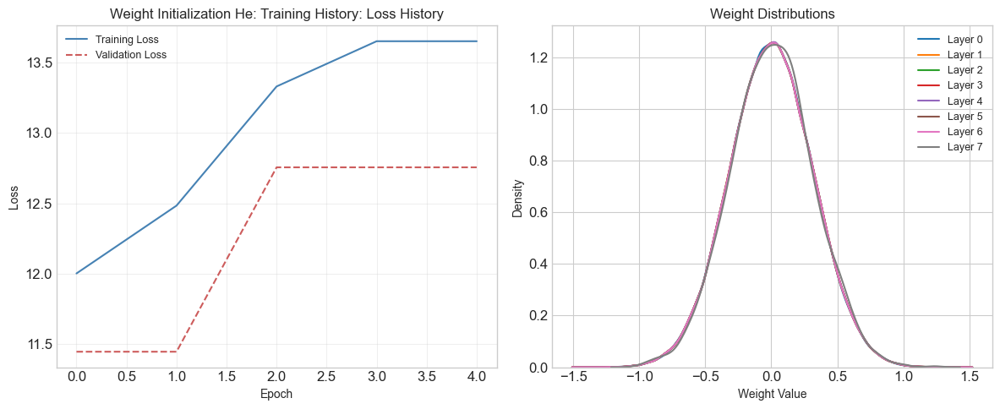

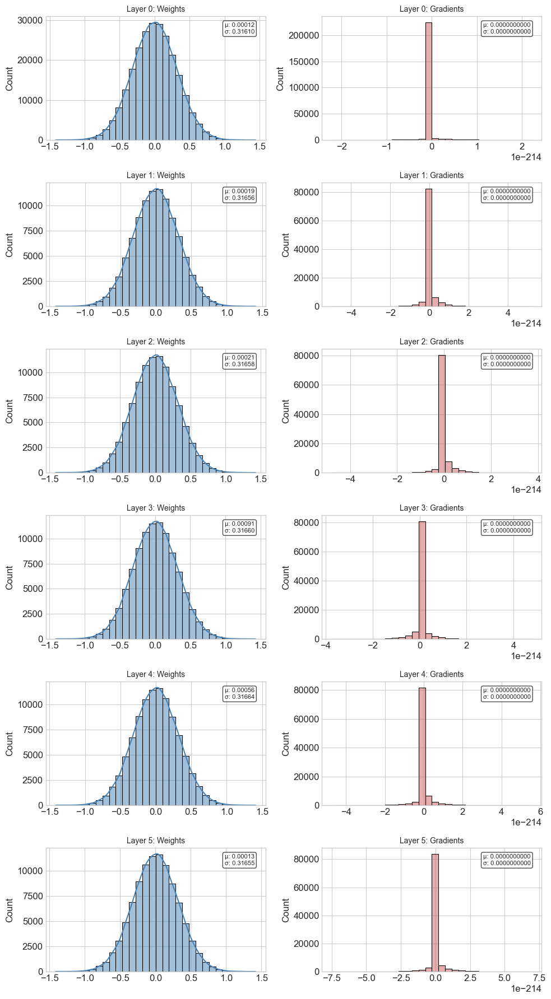

In [ ]:
trained_model_weight_he, history_weight_he, predictions_weight_he, accuracy_weight_he, results_weight_he = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Weight Initialization He",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### Compare

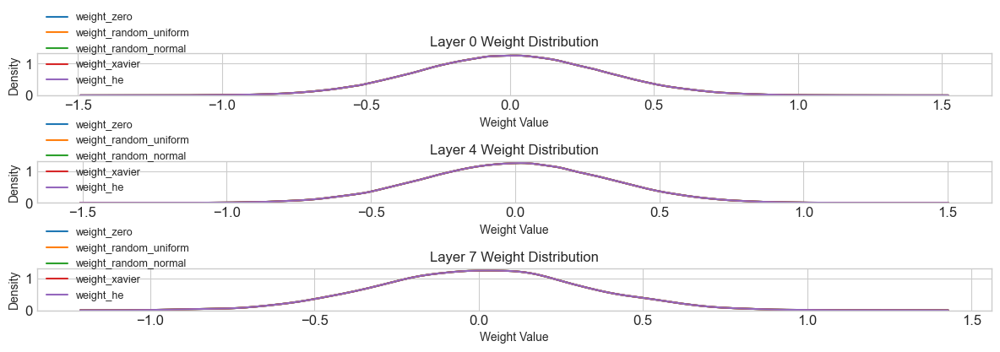

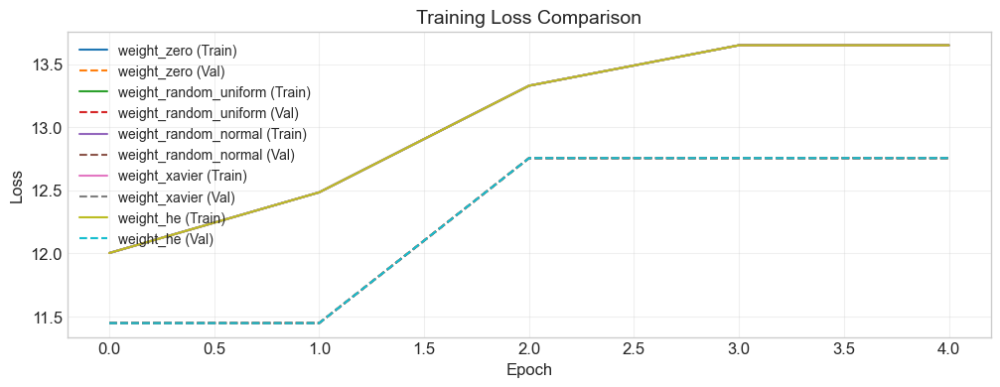

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "weight_zero": (trained_model_weight_zero, history_weight_zero, predictions_weight_zero, accuracy_weight_zero),
    "weight_random_uniform": (trained_model_weight_random_uniform, history_weight_random_uniform, predictions_weight_random_uniform, accuracy_weight_random_uniform),
    "weight_random_normal": (trained_model_weight_random_normal, history_weight_random_normal, predictions_weight_random_normal, accuracy_weight_random_normal),
    "weight_xavier": (trained_model_weight_xavier, history_weight_xavier, predictions_weight_xavier, accuracy_weight_xavier),
    "weight_he": (trained_model_weight_he, history_weight_he, predictions_weight_he, accuracy_weight_he)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Regularization

### None

In [ ]:
trained_model_regularize_none, history_regularize_none, predictions_regularize_none, accuracy_regularize_none, results_regularize_none = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Regularization None",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)


Training Regularization None model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.0001, Loss: categorical_crossentropy, Weight: he
Regularize: l1
Training model with learning_rate=0.0001, batch_size=64, epochs=50
Epoch 1/50 - train_loss: 2.4930 - val_loss: 2.4514oss: 2.4946
Epoch 2/50 - train_loss: 2.4423 - val_loss: 2.4069oss: 2.3971
Epoch 3/50 - train_loss: 2.4047 - val_loss: 2.3732oss: 2.5356
Epoch 4/50 - train_loss: 2.3735 - val_loss: 2.3465oss: 2.4315
Epoch 5/50 - train_loss: 2.3485 - val_loss: 2.3244oss: 2.3587
Epoch 6/50 - train_loss: 2.3274 - val_loss: 2.3055oss: 2.2929
Epoch 7/50 - train_loss: 2.3094 - val_loss: 2.2886oss: 2.2451
Epoch 8/50 - train_loss: 2.2937 - val_loss: 2.2736oss: 2.2571
Epoch 9/50 - train_loss: 2.2791 - val_loss: 2.2594oss: 2.2884
Epoch 10/50 - train_loss: 2.2648 - val_loss: 2.2462oss: 2.1793
Epoch 11/50 - train_loss: 2.2516 - val_loss: 2.2335oss: 2.1903
Epoch 12/50 - train_loss: 2.2395 - val_loss: 2.2213oss:

KeyboardInterrupt: 

### L1


Training Regularization L1 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularize: l1
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 2.3157 - val_loss: 2.1827oss: 2.1748
Epoch 2/50 - train_loss: 2.0760 - val_loss: 1.9300oss: 1.8086
Epoch 3/50 - train_loss: 1.7511 - val_loss: 1.5456oss: 1.5376
Epoch 4/50 - train_loss: 1.3850 - val_loss: 1.2210oss: 1.2098
Epoch 5/50 - train_loss: 1.0991 - val_loss: 0.9843oss: 0.7842
Epoch 6/50 - train_loss: 0.9013 - val_loss: 0.8299oss: 0.9666
Epoch 7/50 - train_loss: 0.7706 - val_loss: 0.7341oss: 0.7159
Epoch 8/50 - train_loss: 0.6874 - val_loss: 0.6697oss: 0.7357
Epoch 9/50 - train_loss: 0.6295 - val_loss: 0.6306oss: 0.6455
Epoch 10/50 - train_loss: 0.5853 - val_loss: 0.5944oss: 0.4034
Epoch 11/50 - train_loss: 0.5510 - val_loss: 0.5707oss: 0.3893
Epoch 12/50 - train_loss: 0.5219 - val_loss: 0.5412oss: 0.4

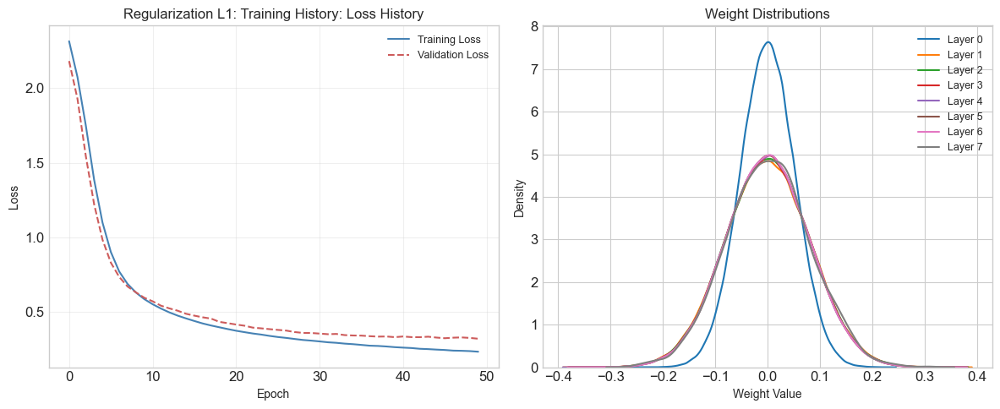

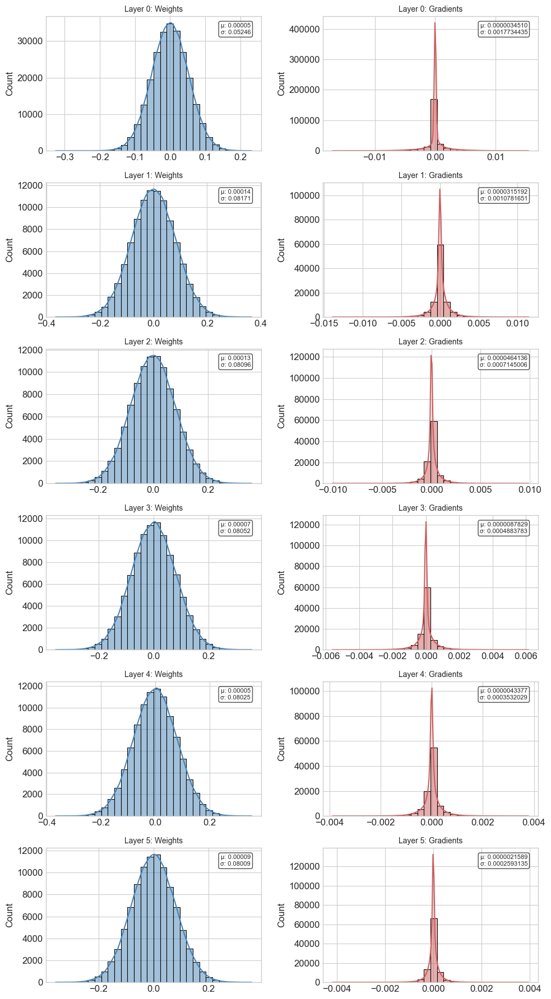

In [ ]:
trained_model_regularize_l1, history_regularize_l1, predictions_regularize_l1, accuracy_regularize_l1, results_regularize_l1 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Regularization L1",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='l1',
    normalization_type='none',
)

### L2

In [ ]:
trained_model_regularize_l2, history_regularize_l2, predictions_regularize_l2, accuracy_regularize_l2, results_regularize_l2 = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Regularization L2",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='l2',
    normalization_type='none',
)


Training Regularization L2 model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularize: l2
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 23.9496 - val_loss: 1.1085ss: 23.3214
Epoch 2/50 - train_loss: 22.9674 - val_loss: 0.6477ss: 22.5016
Epoch 3/50 [###-----------------] 15.4% - batch_loss: 22.6615

KeyboardInterrupt: 

### Compare

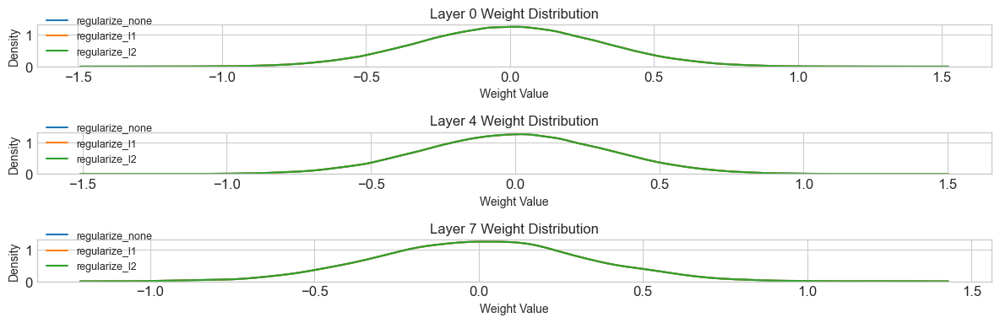

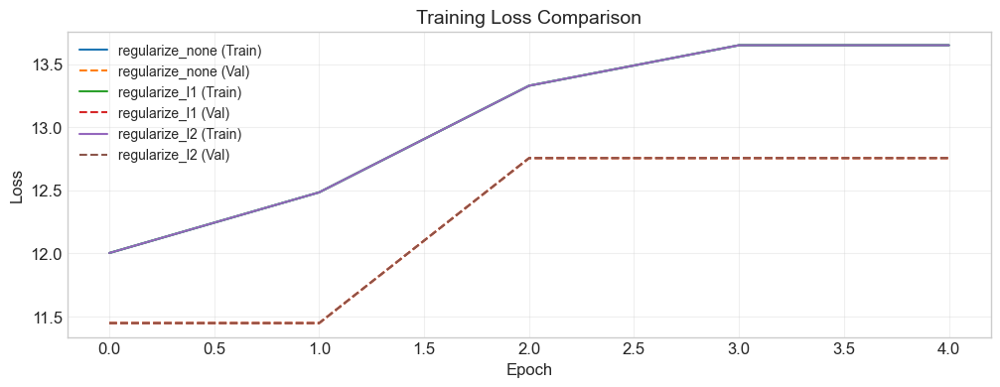

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "regularize_none": (trained_model_regularize_none, history_regularize_none, predictions_regularize_none, accuracy_regularize_none),
    "regularize_l1": (trained_model_regularize_l1, history_regularize_l1, predictions_regularize_l1, accuracy_regularize_l1),
    "regularize_l2": (trained_model_regularize_l2, history_regularize_l2, predictions_regularize_l2, accuracy_regularize_l2)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Normalization

### None


Training Normalization None model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: sigmoid
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Regularization: none
Normalization: none
Training model with learning_rate=0.001, batch_size=1, epochs=5
Epoch 1/5 - train_loss: 12.0022 - val_loss: 11.4471s: 0.00008
Epoch 2/5 - train_loss: 12.4833 - val_loss: 11.4471s: 0.0000
Epoch 3/5 - train_loss: 13.3283 - val_loss: 12.7547s: 34.5388
Epoch 4/5 - train_loss: 13.6490 - val_loss: 12.7547s: 0.0000
Epoch 5/5 - train_loss: 13.6490 - val_loss: 12.7547s: 34.5388
Test accuracy: 0.1143

Model Evaluation Results:
Accuracy: 0.1143


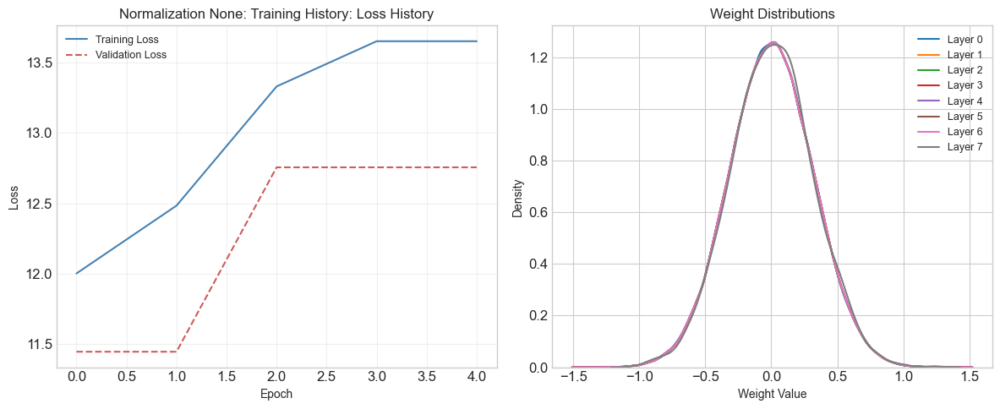

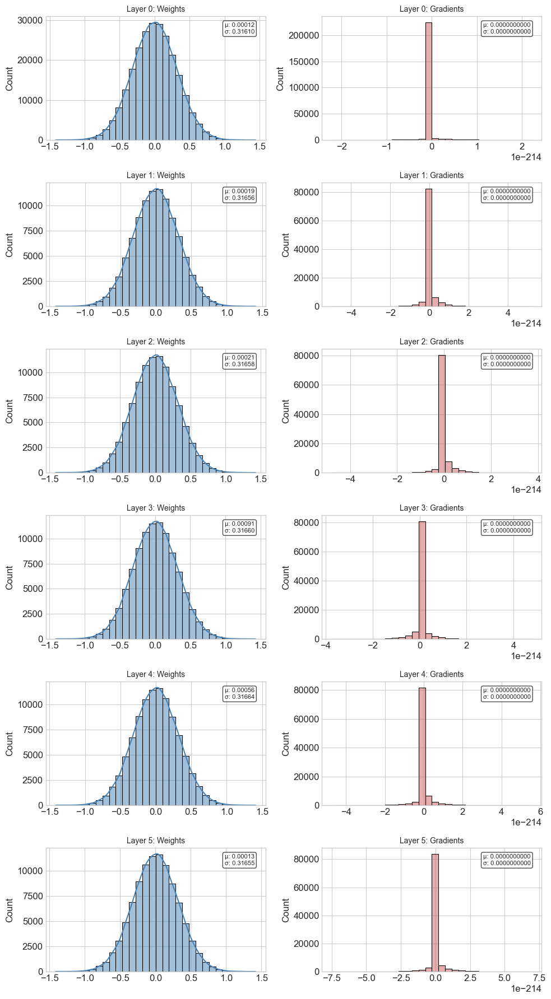

In [ ]:
trained_model_normalize_none, history_normalize_none, predictions_normalize_none, accuracy_normalize_none, results_normalize_none = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Normalization None",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none',
)

### RMS

In [ ]:
trained_model_normalize_rms, history_normalize_rms, predictions_normalize_rms, accuracy_normalize_rms, results_normalize_rms = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="Normalization RMS",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='rms',
)


Training Normalization RMS model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Normalize: rms
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 1.8939 - val_loss: 1.4070oss: 1.4201
Epoch 2/50 - train_loss: 1.1904 - val_loss: 1.0318oss: 0.9218
Epoch 3/50 - train_loss: 0.9014 - val_loss: 0.8405oss: 0.8136
Epoch 4/50 - train_loss: 0.7346 - val_loss: 0.7029oss: 0.5474
Epoch 5/50 - train_loss: 0.6281 - val_loss: 0.6240oss: 0.3841
Epoch 6/50 - train_loss: 0.5556 - val_loss: 0.5681oss: 0.5449
Epoch 7/50 - train_loss: 0.5037 - val_loss: 0.5319oss: 0.4510
Epoch 8/50 - train_loss: 0.4623 - val_loss: 0.5167oss: 0.6801
Epoch 9/50 - train_loss: 0.4341 - val_loss: 0.4814oss: 0.5023
Epoch 10/50 [###########---------] 57.1% - batch_loss: 0.5373

KeyboardInterrupt: 

### Compare

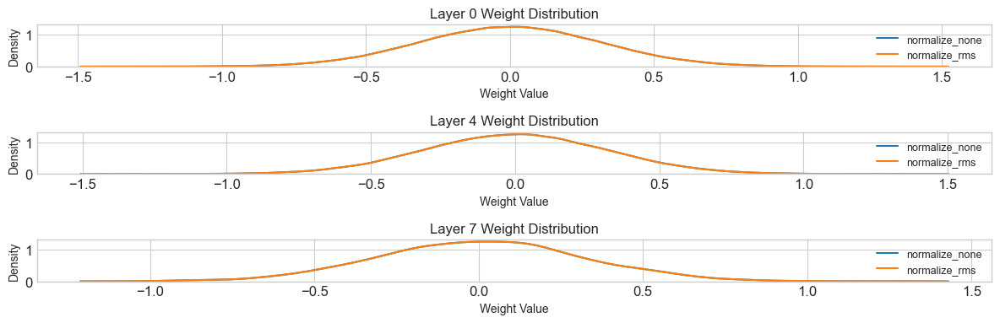

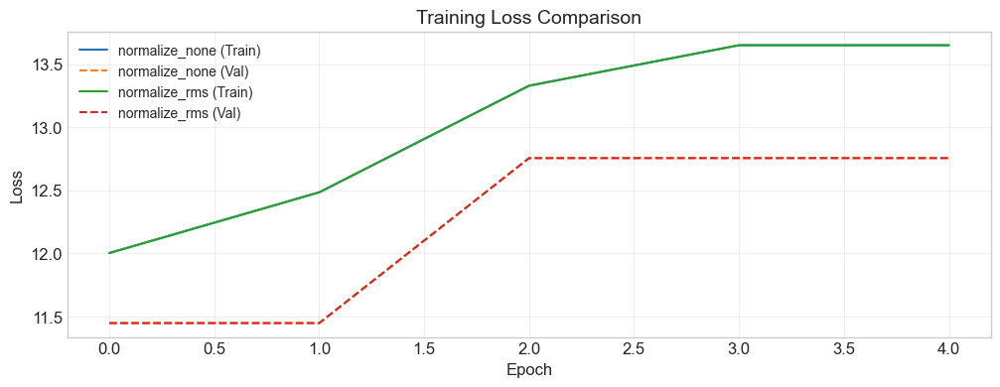

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare multiple models at once
models_dict = {
    "normalize_none": (trained_model_normalize_none, history_normalize_none, predictions_normalize_none, accuracy_normalize_none),
    "normalize_rms": (trained_model_normalize_rms, history_normalize_rms, predictions_normalize_rms, accuracy_normalize_rms)
}

# Compare loss and weight distributions
loss_fig, weights_fig = compare_models_performance(models_dict)
plt.figure(loss_fig.number)
plt.show()
plt.figure(weights_fig.number)
plt.show()

## Final Scratch Model

### Save Model

In [ ]:
# save model

trained_model_capcipcup, history_capcipcup, predictions_capcipcup, accuracy_capcipcup, results_capcipcup = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="CapCipCup Neural Network",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

trained_model_capcipcup.save("capcipcup_model.h5")

### Load Model

In [ ]:
# load model



## Comparison with MLP

### Scratch


Training CapCipCup Neural Network model...
Architecture: [314, 314, 314, 314, 314, 314, 314], Activation: relu, Output: softmax
LR: 0.001, Loss: categorical_crossentropy, Weight: he
Training model with learning_rate=0.001, batch_size=32, epochs=50
Epoch 1/50 - train_loss: 0.6743 - val_loss: 0.0461oss: 0.0021
Epoch 2/50 - train_loss: 0.0365 - val_loss: 0.0296oss: 0.0574
Epoch 3/50 - train_loss: 0.0241 - val_loss: 0.0199oss: 0.0003
Epoch 4/50 - train_loss: 0.0160 - val_loss: 0.0133oss: 0.0741
Epoch 5/50 - train_loss: 0.0093 - val_loss: 0.0067oss: 0.0085
Epoch 6/50 - train_loss: 0.0047 - val_loss: 0.0033oss: 0.0005
Epoch 7/50 - train_loss: 0.0034 - val_loss: 0.0020oss: 0.0000
Epoch 8/50 - train_loss: 0.0028 - val_loss: 0.0014oss: 0.0000
Epoch 9/50 - train_loss: 0.0020 - val_loss: 0.0011oss: 0.0000
Epoch 10/50 - train_loss: 0.0018 - val_loss: 0.0010oss: 0.0002
Epoch 11/50 - train_loss: 0.0015 - val_loss: 0.0010oss: 0.0000
Epoch 12/50 - train_loss: 0.0014 - val_loss: 0.0010oss: 0.0000
Epoc

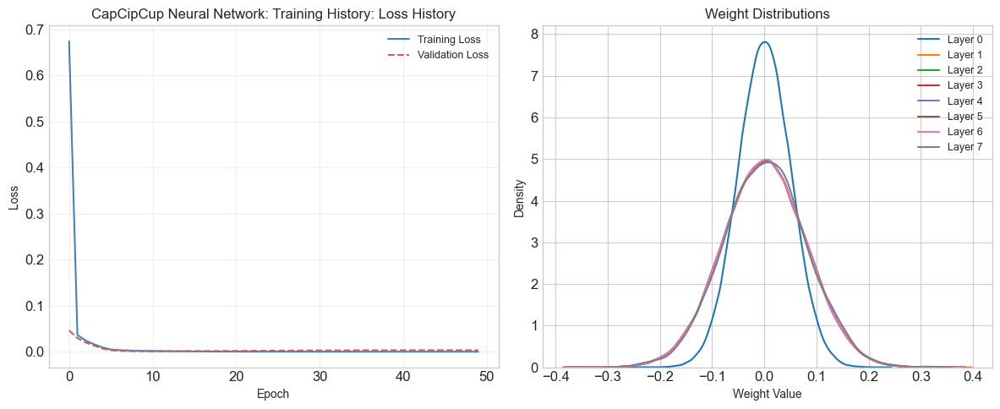

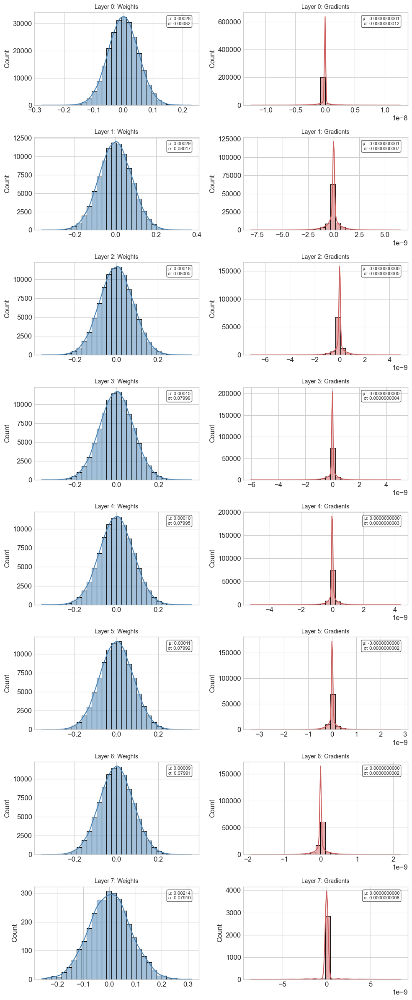


CapCipCup Neural Network Results:
Test Accuracy: 0.9993


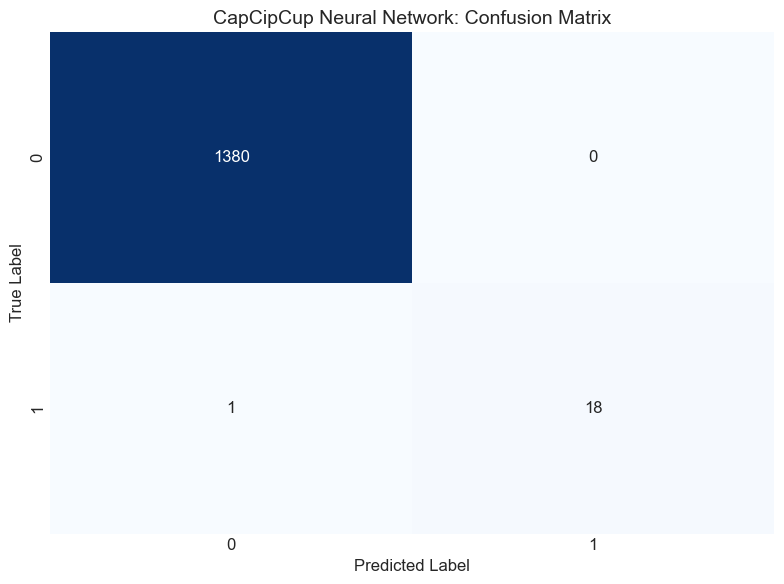

In [ ]:
trained_model_capcipcup, history_capcipcup, predictions_capcipcup, accuracy_capcipcup, results_capcipcup = run_hyperparameter(
    small_X_train, small_X_test, small_y_train, small_y_test,
    name="CapCipCup Neural Network",
    hidden_layers=[314, 314, 314, 314, 314, 314, 314],
    activation_functions='relu',
    output_activation='softmax',
    learning_rate=0.001,
    loss_function='categorical_crossentropy',
    weight_initialization='he',
    regularization_type='none',
    normalization_type='none'
)

# Visualize the custom model training results
print("\nCapCipCup Neural Network Results:")
print(f"Test Accuracy: {accuracy_capcipcup:.4f}")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
cm = results_capcipcup["confusion_matrix"]
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title("CapCipCup Neural Network: Confusion Matrix", fontsize=14)
plt.ylabel("True Label", fontsize=12)
plt.xlabel("Predicted Label", fontsize=12)
plt.tight_layout()
plt.show()

### MLP Library

In [ ]:
# Create MLP model with similar architecture to your custom model
print("Training scikit-learn MLPClassifier model...")
print(f"Architecture: 7 hidden layers of 314 neurons each")
print(f"Activation: relu, Learning rate: 0.001, Max iterations: 50")

# Start timing
start_time = time.time()

# Create and train MLP classifier
mlp_model = MLPClassifier(
    hidden_layer_sizes=(314, 314, 314, 314, 314, 314, 314),
    activation='relu',
    solver='adam',
    alpha=0.0001,
    learning_rate_init=0.001, 
    max_iter=50,
    random_state=42, 
    verbose=True
)

# Fit the model
mlp_model.fit(small_X_train, np.argmax(small_y_train, axis=1))

# End timing
training_time = time.time() - start_time

# Get predictions
mlp_predictions_proba = mlp_model.predict_proba(small_X_test)
mlp_predictions = mlp_model.predict(small_X_test)
mlp_accuracy = mlp_model.score(small_X_test, np.argmax(small_y_test, axis=1))

print(f"\nTraining completed in {training_time:.2f} seconds")
print(f"Test accuracy: {mlp_accuracy:.4f}")

# Store results in a similar format to your custom model
mlp_history = {
    "train_loss": mlp_model.loss_curve_,
    # No validation loss available in sklearn's MLPClassifier
}

# Convert predictions to same format as your custom model for comparison
mlp_predictions_one_hot = np.zeros_like(small_y_test)
for i, pred_idx in enumerate(mlp_predictions):
    mlp_predictions_one_hot[i, pred_idx] = 1

# Create confusion matrix
from sklearn.metrics import confusion_matrix
mlp_cm = confusion_matrix(np.argmax(small_y_test, axis=1), mlp_predictions)

# Store results for comparison
mlp_results = {
    "model": mlp_model,
    "history": mlp_history,
    "predictions": mlp_predictions_one_hot,
    "accuracy": mlp_accuracy,
    "confusion_matrix": mlp_cm,
    "training_time": training_time
}

# Plot confusion matrix for scikit-learn model
plt.figure(figsize=(8, 6))
sns.heatmap(mlp_cm, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.title("Scikit-Learn MLP: Confusion Matrix", fontsize=14)
plt.ylabel("True Label", fontsize=12)
plt.xlabel("Predicted Label", fontsize=12)
plt.tight_layout()
plt.show()

Training scikit-learn MLPClassifier model...
Architecture: 7 hidden layers of 314 neurons each
Activation: relu, Learning rate: 0.001, Max iterations: 50


NameError: name 'time' is not defined

### Compare


    Model Comparison Summary:
    ------------------------------------------------------------
    Model           Accuracy   Parameters
    ------------------------------------------------------------
    Custom NN       0.9993     843100    
    Scikit MLP      0.9986     840265    
    ------------------------------------------------------------
    
    Performance difference: -0.07%
    


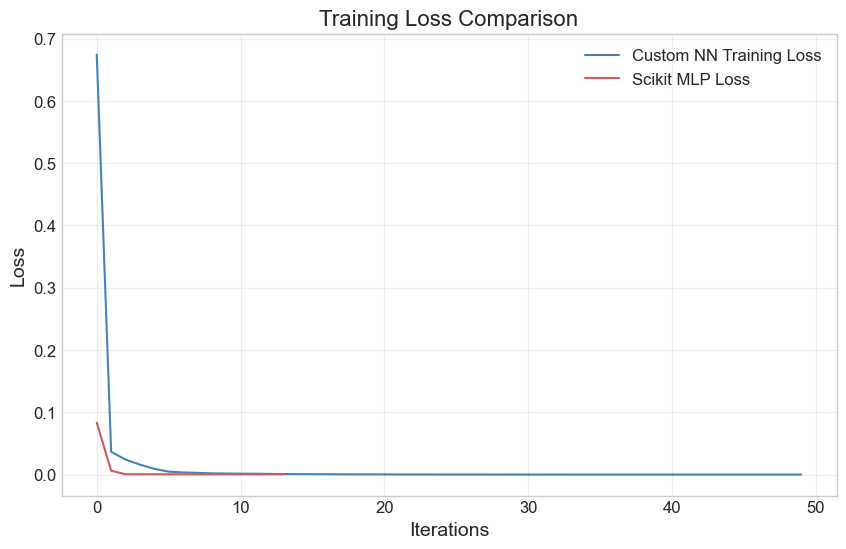

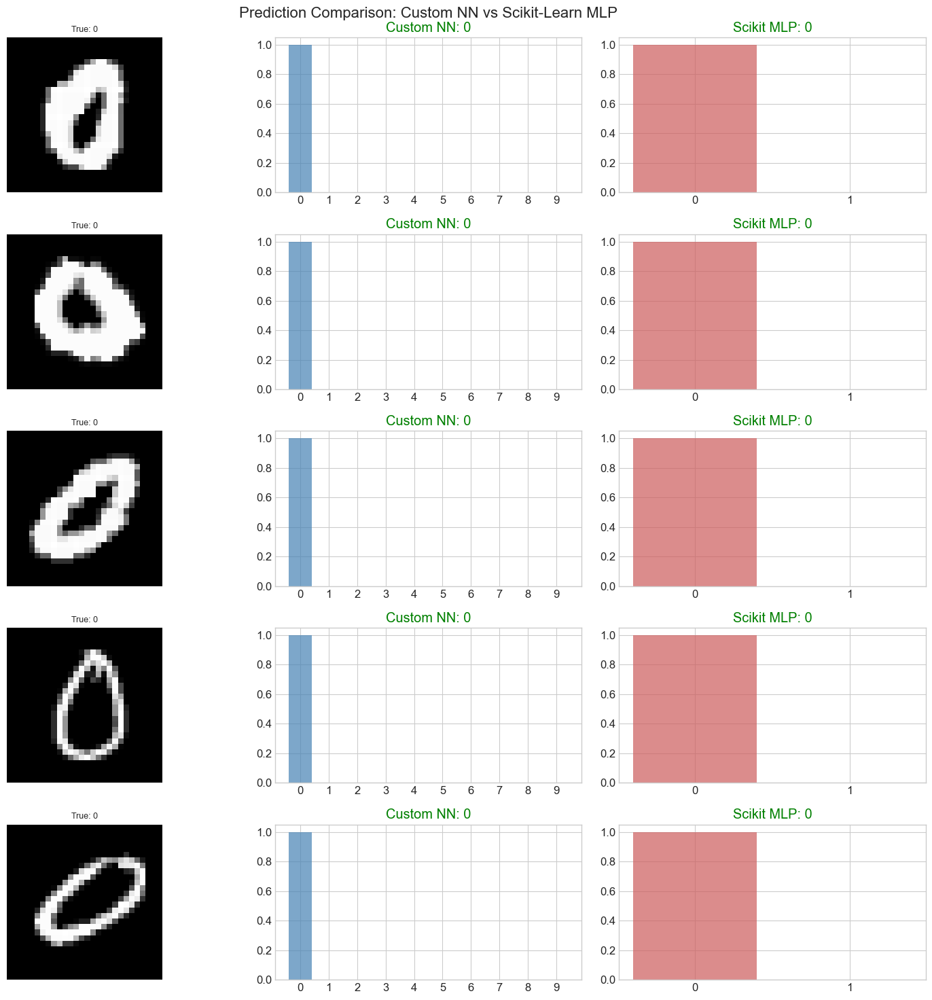

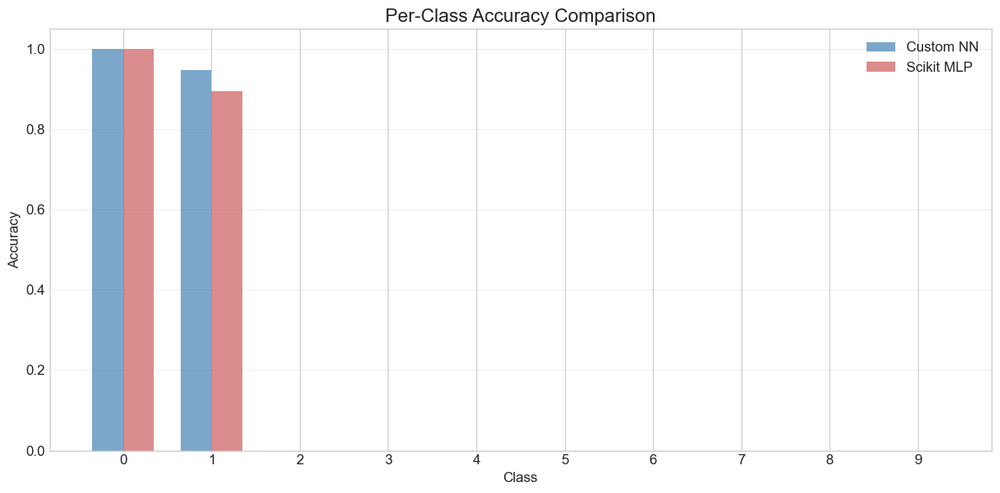

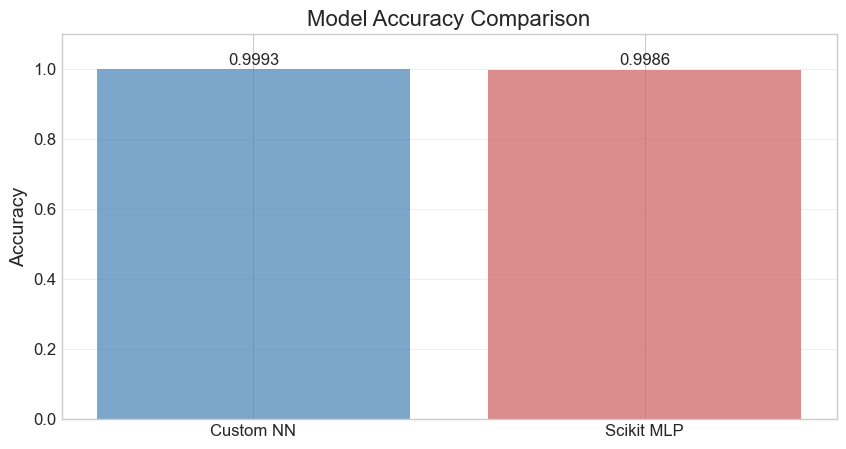

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

In [ ]:
# Compare models
comparison_figures, summary = visualize_model_comparison(
    custom_model=trained_model_capcipcup,
    sklearn_model=mlp_model,
    X_test=small_X_test,
    y_test=small_y_test,
    custom_history=history_capcipcup,
    sklearn_history={'loss': mlp_model.loss_curve_} if hasattr(mlp_model, 'loss_curve_') else None,
    custom_preds=predictions_capcipcup
)

# Print the summary
print(summary)

# Display all figures
for fig_name, fig in comparison_figures.items():
    plt.figure(fig.number)
    plt.show()